# Import libraries

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import copy
import seaborn as sns
import matplotlib.pyplot as plt
import math
import xgboost as xg
import tensorflow as tf
import os
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import GroupShuffleSplit
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Dropout, Input
import warnings

warnings.filterwarnings("ignore", message="use_inf_as_na option is deprecated and will be removed in a future version")

2024-07-02 05:03:47.724537: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-02 05:03:47.724674: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-02 05:03:47.877831: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# Define feature names and import data

In [2]:
index_names = ['engine', 'cycle']
setting_names = ['setting_1', 'setting_2', 'setting_3']
sensor_names=[ 
    "S1(Fan inlet temperature) (◦R)",
    "S2(LPC outlet temperature) (◦R)",
    "S3(HPC outlet temperature) (◦R)",
    "S4(LPT outlet temperature) (◦R)",
    "S5(Fan inlet Pressure) (psia)",
    "S6(bypass-duct pressure) (psia)",
    "S7(HPC outlet pressure) (psia)",
    "S8(Physical fan speed) (rpm)",
    "S9(Physical core speed) (rpm)",
    "S10(Engine pressure ratio) (P50/P2)",
    "S11(HPC outlet Static pressure) (psia)",
    "S12(Ratio of fuel flow to Ps30) (pps/psia)",
    "S13(Corrected fan speed) (rpm)",
    "S14(Corrected core speed) (rpm)",
    "S15(Bypass Ratio) ",
    "S16(Burner fuel-air ratio)",
    "S17(Bleed Enthalpy)",
    "S18(Required fan speed)",
    "S19(Required fan conversion speed)",
    "S20(High-pressure turbines Cool air flow)",
    "S21(Low-pressure turbines Cool air flow)" ]
col_names = index_names + setting_names + sensor_names

df_train = pd.read_csv(('/kaggle/input/nasa-cmaps/CMaps/train_FD002.txt'), sep='\s+', header=None, names=col_names)
df_test = pd.read_csv(('/kaggle/input/nasa-cmaps/CMaps/test_FD002.txt'), sep='\s+', header=None, names=col_names)
df_test_RUL = pd.read_csv(('/kaggle/input/nasa-cmaps/CMaps/RUL_FD002.txt'), sep='\s+', header=None, names=['RUL'])

# Exploratory Data Analysis

In [3]:
# Get the maximum 'cycle' for each engine
max_cycles = df_train.groupby('engine')['cycle'].max().reset_index()

# count number of records per engine
record_counts = df_train['engine'].value_counts().reset_index()
record_counts.columns = ['engine', 'count']

# Merge two DataFrames to check if maximum cycle == number of records
compare_df = pd.merge(max_cycles, record_counts, on='engine')

# add new column to show results of comparison between max cycles & record counts
compare_df['count_equals_max_cycle'] = compare_df['cycle'] == compare_df['count']

# Check for a value of False
false_values = compare_df[compare_df['count_equals_max_cycle'] == False]
print("Number of rows where maximum cycle != number of records:", len(false_values))

Number of rows where maximum cycle != number of records: 0


Insights: 
Total number of rows for each engine correspond to its maximum cycle

Text(0.5, 9.444444444444459, 'Max Cycles')

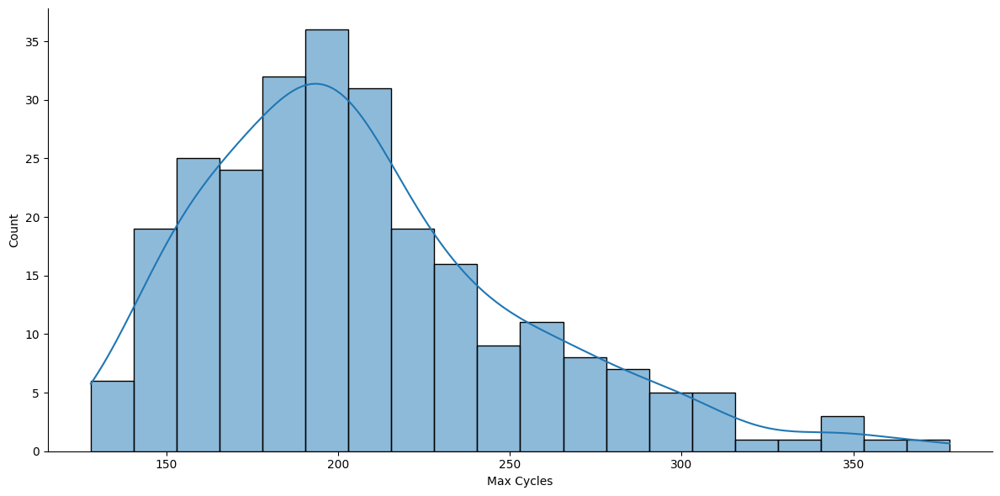

In [4]:
#Plot distribution of maximum cycles
sns.displot(max_cycles['cycle'],kde=True,bins=20,height=6,aspect=2)
plt.xlabel('Max Cycles')

**Insights:** 

Right skewed cycle distribution, ranging from around 140 to about 360 with highest frequency (central tendency) at or around 200. Outliers are more prominent after 300 + as shown on the long tail streching to the right. 

From this distribution, we obeserve that the average cycles for the engines in this dataset is 200 on average.

In [5]:
# Create a new column 'RUL', which corresponds to the remaining cycles for each unit before it fails: 
# (max_cycle - current_cycle)
def add_RUL(data):
    max_cycles = data.groupby('engine')['cycle'].max().reset_index()
    max_cycles.columns = ['engine', 'max_cycle']
    new_df = data.merge(max_cycles, on='engine')
    new_df["RUL"] = new_df["max_cycle"] - new_df['cycle']
    new_df = new_df.drop("max_cycle", axis=1)
    return new_df

train = add_RUL(df_train)

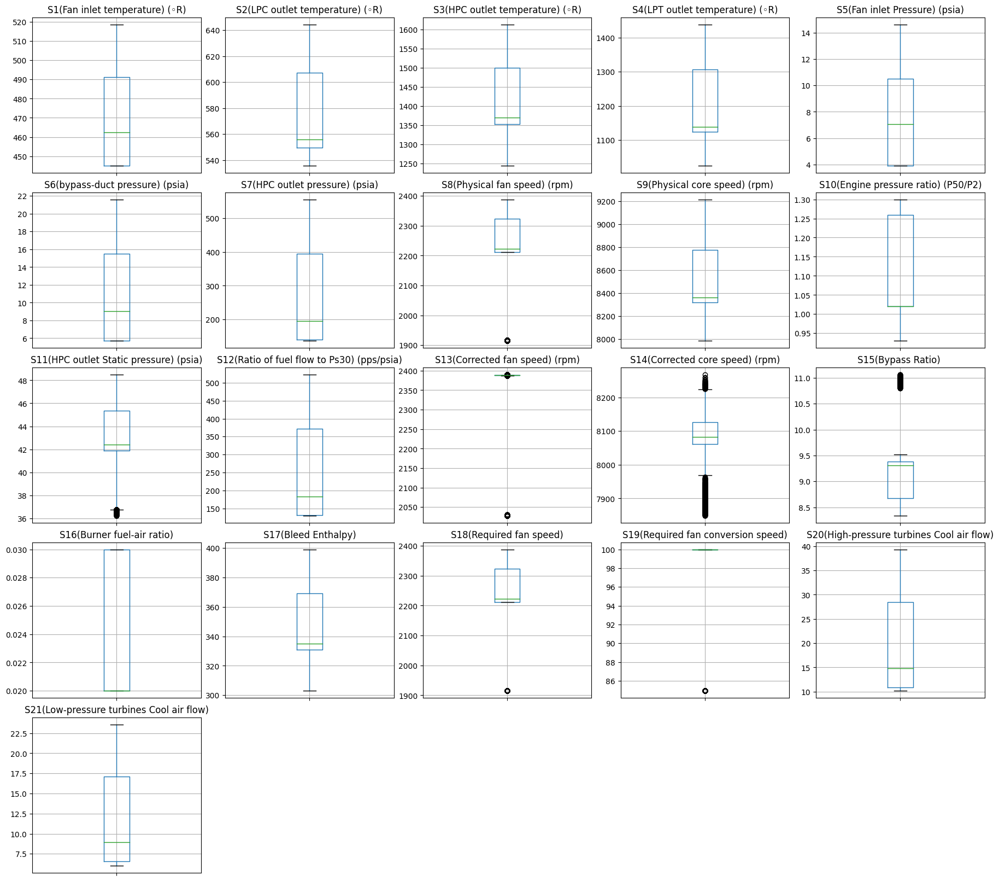

In [6]:
# Create the DataFrame with the specific columns
df_train_sensors = df_train[sensor_names]

# # Number of sensors
num_sensors = len(sensor_names)

# # Determine the number of rows and columns for the subplots grid
cols = 5
rows = (num_sensors + cols - 1) // cols  # Ensure enough rows to accommodate all sensors

fig, axes = plt.subplots(rows, cols, figsize=(18, 16), constrained_layout=True)

# # Flatten the axes array for easy iteration
axes = axes.flatten()

for i, sensor in enumerate(sensor_names):
    df_train_sensors[[sensor]].boxplot(ax=axes[i])
    axes[i].set_title(sensor)
    axes[i].set_xticklabels([])  # Hide x-axis labels for better readability

# # Hide any remaining empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.show()

**Insights:**

    Fan inlet temperature, LPC outlet temperature, and other temperatures: These parameters show relatively tight distributions with narrow IQRs, indicating less variability and consistent measurements

    Pressure Readings (e.g., HPC outlet pressure): These measurements have a wide spread and some outliers, indicating occasional fluctuations that could be significant in operational contexts.

    RPM (e.g., Corrected fan speed): The corrected fan speed has a cluster of outliers at the lower end, which might indicate occasional underperformance or measurement errors.

    Bypass Ratio and Burner Fuel-air Ratio: These parameters show some significant outliers and an asymmetric distribution, suggesting factors that could impact engine efficiency and might require further investigation.


## Correlation Analysis - how sensors and settings relate to each other.

A common method in selecting features is by calculating the correlation of the features. 

<Axes: >

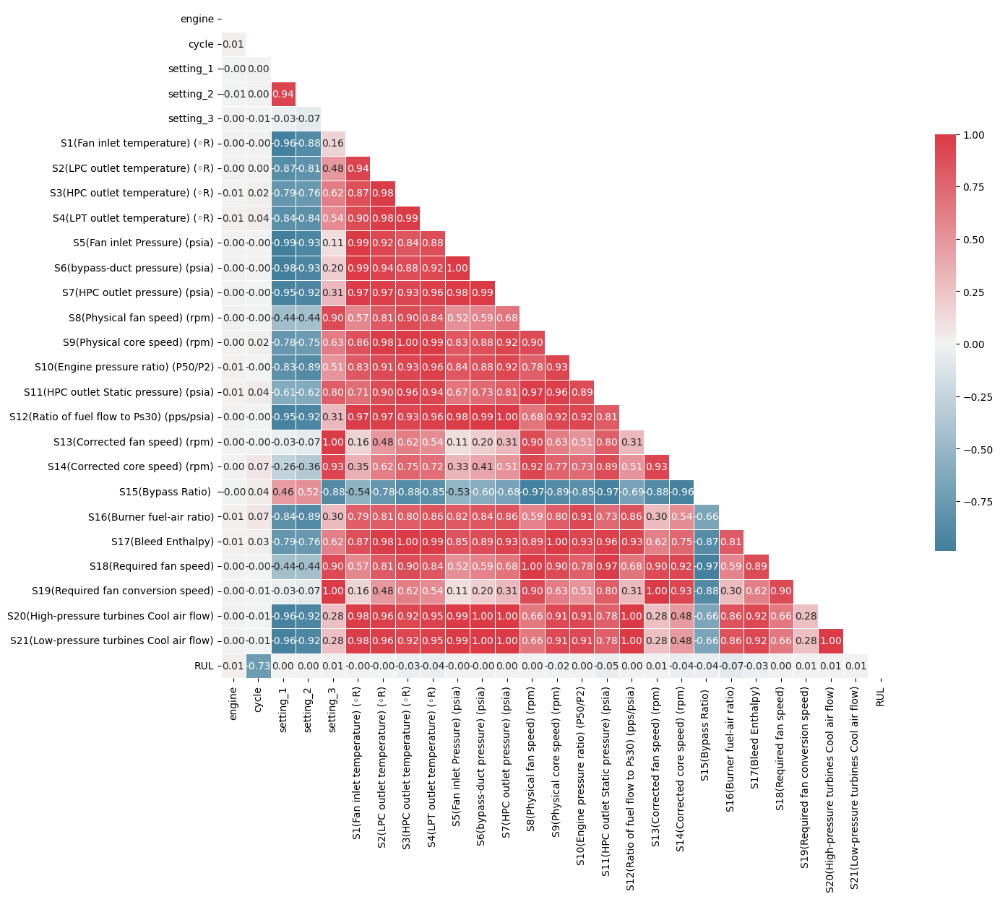

In [7]:
# Compute the correlation matrix
corr = train.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(15, 15))
cmap = sns.diverging_palette(230, 10, as_cmap=True)
# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, center=0,square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt=".2f")

**Insights:**

    We observe high correlations between the different sensors. Conversely, the correlation between the sensors and engine/cycle does not seem to be correlated.

    We can potentially remove perfeclty corr features to test if they improve performance

perfectly correlated features 
S5 and S6

S7 and S12

S3 and S9
S3 and S17
S9 and S17

S8 and S18

S13 and setting 3
S19 and setting 3
S19 and S13

S6 and S20
S7 and S20
S12 and S20
S6 and S21
S7 and S21
S12 and S21
S20 and S21

In [8]:
sensor_names

['S1(Fan inlet temperature) (◦R)',
 'S2(LPC outlet temperature) (◦R)',
 'S3(HPC outlet temperature) (◦R)',
 'S4(LPT outlet temperature) (◦R)',
 'S5(Fan inlet Pressure) (psia)',
 'S6(bypass-duct pressure) (psia)',
 'S7(HPC outlet pressure) (psia)',
 'S8(Physical fan speed) (rpm)',
 'S9(Physical core speed) (rpm)',
 'S10(Engine pressure ratio) (P50/P2)',
 'S11(HPC outlet Static pressure) (psia)',
 'S12(Ratio of fuel flow to Ps30) (pps/psia)',
 'S13(Corrected fan speed) (rpm)',
 'S14(Corrected core speed) (rpm)',
 'S15(Bypass Ratio) ',
 'S16(Burner fuel-air ratio)',
 'S17(Bleed Enthalpy)',
 'S18(Required fan speed)',
 'S19(Required fan conversion speed)',
 'S20(High-pressure turbines Cool air flow)',
 'S21(Low-pressure turbines Cool air flow)']

 #### Relationships between multiple sensors and rul

/tmp/ipykernel_18/1793153663.py:18: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


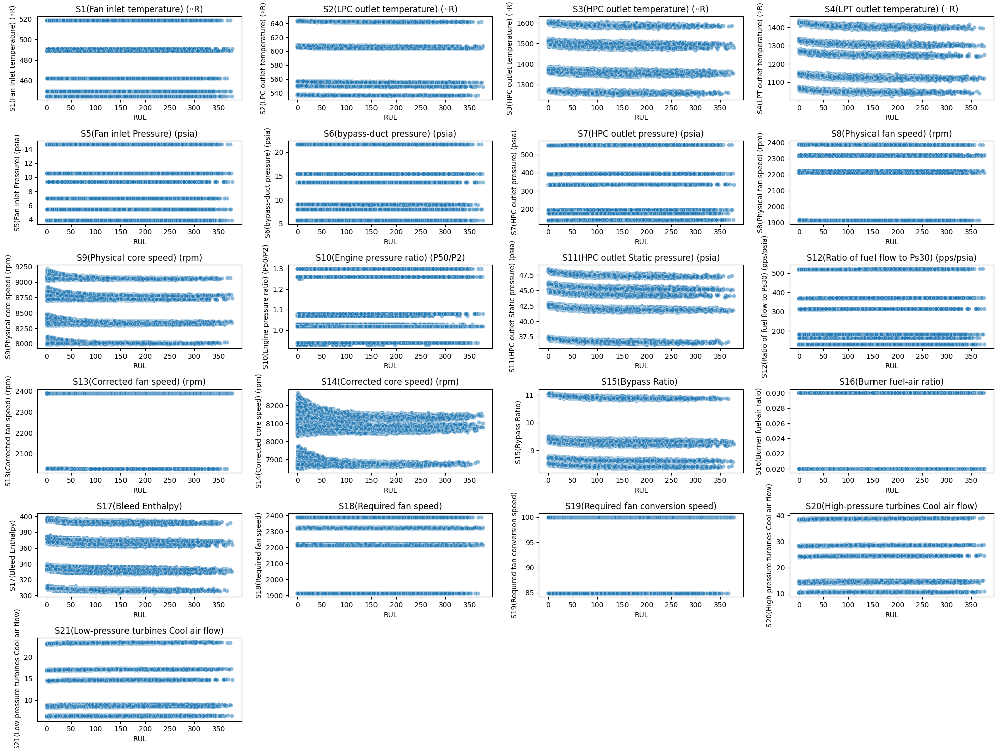

In [9]:
num_sensors = len(sensor_names)
cols = 4  # Number of columns in the subplot grid
rows = (num_sensors + cols - 1) // cols  # Calculate the number of rows needed

fig, axes = plt.subplots(rows, cols, figsize=(20, 15), constrained_layout=True)
axes = axes.flatten()

for i, sensor in enumerate(sensor_names):
    sns.scatterplot(x='RUL', y=sensor, data=train, ax=axes[i], alpha=0.5)
    axes[i].set_title(sensor)
    axes[i].set_xlabel('RUL')
    axes[i].set_ylabel(sensor)

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


**Insights:**

    Based on the scatterplot for the individual sensors, we observe that different clusters of average values. This coincides with the number of operating conditions.


# Descriptive statistics


In [10]:
df_train.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
engine,53759.0,131.082981,74.463862,1.0000,68.0000,131.0000,195.0000,260.0000
cycle,53759.0,109.154746,69.180569,1.0000,52.0000,104.0000,157.0000,378.0000
setting_1,53759.0,23.998407,14.747376,0.0000,10.0046,25.0013,41.9980,42.0080
setting_2,53759.0,0.572056,0.310016,0.0000,0.2507,0.7000,0.8400,0.8420
setting_3,53759.0,94.046020,14.237735,60.0000,100.0000,100.0000,100.0000,100.0000
S1(Fan inlet temperature) (◦R),53759.0,472.910207,26.389707,445.0000,445.0000,462.5400,491.1900,518.6700
S2(LPC outlet temperature) (◦R),53759.0,579.672399,37.289399,535.5300,549.5700,555.9800,607.3400,644.5200
S3(HPC outlet temperature) (◦R),53759.0,1419.971013,105.946341,1243.7300,1352.7600,1369.1800,1499.3700,1612.8800
S4(LPT outlet temperature) (◦R),53759.0,1205.442024,119.123428,1023.7700,1123.6550,1138.8900,1306.8500,1439.2300
S5(Fan inlet Pressure) (psia),53759.0,8.031986,3.613839,3.9100,3.9100,7.0500,10.5200,14.6200


**Insights:**

    Setting 3 shows a low standard deviation of 14.2 as compared to a high mean of 94.0.
    It is noteworthy that 25%, 50%, 75% and max are 100.

    Setting 2 has a standard deviation of 0.31, with a mean value of 0.57
    Setting 1 has a standard deviation of 14.75, with a mean value of  24

    Setting_1 and Setting_2 show a broad range of parameters with Setting_1 ranging from 0 to about 42 and Setting_2 from 0 to 0.842. The standard deviations suggest some variability in how these settings are adjusted across different engines and time cycles.
    Setting_3 is predominantly at 100, indicating a frequent operational mode for most observations, except for a few instances where it drops to 60. This drop could indicate special operational modes or conditions.


## Exploring the combinations of the different settings to confirm 6 different operating conditions

In this dataset, it was noted that there are 6 operating conditions. Grouping the engines by the operating conditions, there seems to be an a higher number of engines operating in condition 6.

In [11]:
def process_settings(df_train, setting_names, rounding_info=None):
    settings_df = df_train[setting_names].copy()
    if rounding_info is not None:
        for setting, decimals in rounding_info.items():
            if setting in settings_df.columns:
                settings_df[setting] = settings_df[setting].round(decimals=decimals)
    return settings_df.groupby(by=setting_names).size()

rounding_info = {'setting_1': 0, 'setting_2': 2}
settings_result = process_settings(df_train, ['setting_1', 'setting_2'], rounding_info)
print(settings_result)
print("There are " + str(len(settings_result)) + " combinations")

setting_1  setting_2
0.0        0.00          8044
10.0       0.25          8096
20.0       0.70          8122
25.0       0.62          8002
35.0       0.84          8037
42.0       0.84         13458
dtype: int64
There are 6 combinations


# Linear Regression (Baseline)
As a baseline, our naive approach towards the problem would be using a linear regression to model the RUL of the engines considering the time-series nature of the data. This approach provides a straightforward model to establish foundational insights and performance metrics, upon which more complex models can be built and compared. 

To quantify the performance between models, we will be use RMSE and scoring function as a basis for comaprison.
In several literatures, performance metrics of the models were quantified using scoring function and RMSE. Compared to RMSE, the scoring function is an asymmetric function which penalises late prediction more than early prediction as late prediction would result in more severe consequences. 
- Overpredictions are penalized more softly (-d/10) compared to underpredictions (d/13)

[1] S. Zhao et al., "A Novel Deep Learning Approach for Machinery Prognostics Based on Time Windows," ResearchGate, Nov. 2019. [Online]. Available: https://www.researchgate.net/publication/337191254_A_Novel_Deep_Learning_Approach_for_Machinery_Prognostics_Based_on_Time_Windows.

## Training baseline model without data augmentation to find out baseline RMSE

## Create and fit model


In [12]:
X_train = train[setting_names + sensor_names].copy()
y_train = train['RUL'].copy()
y_test = df_test_RUL
X_test = df_test.drop('cycle', axis=1).groupby('engine').last().copy() 

def evaluate(y_true, y_hat, label='test'):
    # Convert y_true to numpy array if it is a pandas DataFrame or Series
    if isinstance(y_true, (pd.DataFrame, pd.Series)):
        y_true = y_true.values

    # Convert y_hat to numpy array if it is a pandas DataFrame or Series
    if isinstance(y_hat, (pd.DataFrame, pd.Series)):
        y_hat = y_hat.values
        
    y_true = np.ravel(y_true)
    y_hat = np.ravel(y_hat)


    # Calculate MSE and derive RMSE
    mse = mean_squared_error(y_true, y_hat)
    rmse = np.sqrt(mse)
    
    # Calculate R-squared
    variance = r2_score(y_true, y_hat)
    
    # Calculate custom score
    score = 0
    for j in range(len(y_true)):
        d = y_hat[j] - y_true[j]
        if d >= 0:
            score += 1-math.exp(-d / 10) 
        else:
            score += 1-math.exp(d / 13) 
#     for j in range(len(y_true)):
#         d = y_hat[j] - y_true[j]
#         if d >= 0:
#             score += math.exp(d / 10) - 1
#         else:
#             score += math.exp(-d / 13) - 1          
            
    # Print all metrics
    print('{} set RMSE: {:.2f}, R2: {:.2f}, Scoring Function: {:.2f}'.format(label, rmse, variance, score))
    
    # Return metrics
    return rmse, variance, score

In [13]:
lm = LinearRegression()
lm.fit(X_train, y_train)

# predict and evaluate
print("LR")
y_hat_train = lm.predict(X_train)
RMSE_Train, R2_Train, Score_Train = evaluate(y_train, y_hat_train, label='train')

y_hat_test = lm.predict(X_test)
RMSE_Test, R2_Test, Score_Test = evaluate(y_test, y_hat_test, label='test')

# Make Dataframe which will contain results of all applied Model
Results=pd.DataFrame({'Model':['LR'],
                      'RMSE-Train':[RMSE_Train],
                      'R2-Train':[R2_Train],
                      'Score-Train':[Score_Train],                      
                      'RMSE-Test':[RMSE_Test],
                      'R2-Test':[R2_Test],
                      'Score-Test':[Score_Test]})
Results


LR
train set RMSE: 45.03, R2: 0.58, Scoring Function: 42990.69
test set RMSE: 33.94, R2: 0.60, Scoring Function: 198.54


,Model,RMSE-Train,R2-Train,Score-Train,RMSE-Test,R2-Test,Score-Test
0,LR,45.029737,0.576319,42990.689173,33.942725,0.601644,198.538305


Baseline RMSE is 33.9427

Baseline Score is 2713.6802

# Finding the optimising clipped value to improve model performance

As system degradation generally remains negligible until after some periods, we explored introducing clipping to truncate these values, possibly stabilising the models.

In [14]:
# Initialize your results DataFrame if not already initialized
ClipResults = pd.DataFrame(columns=['Model', 
                                        'RMSE-Train', 
                                        'R2-Train', 
                                        'Score-Train', 
                                        'RMSE-Test', 
                                        'R2-Test', 
                                        'Score-Test'])

for upper_bound in range(100, 350, 10):
    # Clipping the target variable
    y_train_clipped = y_train.clip(upper=upper_bound)

    # Training the model
    lm = LinearRegression()
    lm.fit(X_train, y_train_clipped)

    # Predicting and evaluating for train set
    print(f"LR-Clipped-{upper_bound}")
    y_hat_train = lm.predict(X_train)
    RMSE_Train, R2_Train, Score_Train = evaluate(y_train, y_hat_train, 'train')

    # Predicting and evaluating for test set
    y_hat_test = lm.predict(X_test)
    RMSE_Test, R2_Test, Score_Test = evaluate(y_test, y_hat_test)

    # Storing results in DataFrame
    result = pd.DataFrame({
        'Model': [f'LR-Clipped-{upper_bound}'],
        'RMSE-Train': [RMSE_Train],
        'R2-Train': [R2_Train],
        'Score-Train': [Score_Train],
        'RMSE-Test': [RMSE_Test],
        'R2-Test': [R2_Test],
        'Score-Test': [Score_Test]
    })
    ClipResults = pd.concat([ClipResults, result], ignore_index=True)


LR-Clipped-100
train set RMSE: 60.91, R2: 0.22, Scoring Function: 41999.68
test set RMSE: 37.79, R2: 0.51, Scoring Function: 184.43
LR-Clipped-110


/tmp/ipykernel_18/2109177233.py:37: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  ClipResults = pd.concat([ClipResults, result], ignore_index=True)


train set RMSE: 57.14, R2: 0.32, Scoring Function: 41846.88
test set RMSE: 35.20, R2: 0.57, Scoring Function: 184.39
LR-Clipped-120
train set RMSE: 54.02, R2: 0.39, Scoring Function: 41772.85
test set RMSE: 33.33, R2: 0.62, Scoring Function: 183.99
LR-Clipped-130
train set RMSE: 51.52, R2: 0.45, Scoring Function: 41796.80
test set RMSE: 32.11, R2: 0.64, Scoring Function: 184.03
LR-Clipped-140
train set RMSE: 49.58, R2: 0.49, Scoring Function: 41885.59
test set RMSE: 31.44, R2: 0.66, Scoring Function: 185.43
LR-Clipped-150
train set RMSE: 48.14, R2: 0.52, Scoring Function: 41999.65
test set RMSE: 31.20, R2: 0.66, Scoring Function: 187.04
LR-Clipped-160
train set RMSE: 47.11, R2: 0.54, Scoring Function: 42139.30
test set RMSE: 31.25, R2: 0.66, Scoring Function: 188.48
LR-Clipped-170
train set RMSE: 46.38, R2: 0.55, Scoring Function: 42285.69
test set RMSE: 31.47, R2: 0.66, Scoring Function: 191.31
LR-Clipped-180
train set RMSE: 45.89, R2: 0.56, Scoring Function: 42412.14
test set RMSE: 3

In [15]:
# Lowest RMSE
lowest_rmse_test = ClipResults.loc[ClipResults['RMSE-Test'].idxmin()]

# Lowest R2 (Highest Variance) 
lowest_r2_test = ClipResults.loc[ClipResults['R2-Test'].idxmax()]    # Assuming we want the highest (use idxmin for lowest)

# Lowest Score 
lowest_score_test = ClipResults.loc[ClipResults['Score-Test'].idxmin()]

print("\nModel with the Lowest RMSE on Testing Data:")
print(lowest_rmse_test)

# print("\nModel with the Lowest R2 (Highest Variance) on Testing Data:")
# print(lowest_r2_test)

print("\nModel with the Lowest Score on Testing Data:")
print(lowest_score_test)




Model with the Lowest RMSE on Testing Data:
Model          LR-Clipped-150
RMSE-Train          48.143853
R2-Train             0.515692
Score-Train      41999.651215
RMSE-Test           31.199892
R2-Test              0.663423
Score-Test         187.043416
Name: 5, dtype: object

Model with the Lowest Score on Testing Data:
Model          LR-Clipped-120
RMSE-Train          54.015777
R2-Train             0.390349
Score-Train      41772.845703
RMSE-Test           33.326632
R2-Test              0.615974
Score-Test         183.992211
Name: 2, dtype: object


In [16]:
y_train_clipped = y_train.clip(upper=150)

lm = LinearRegression()
lm.fit(X_train, y_train_clipped)

# predict and evaluate
print("LR-Clipped-150")
y_hat_train = lm.predict(X_train)
RMSE_Train, R2_Train, Score_Train = evaluate(y_train_clipped, y_hat_train, 'train')

y_hat_test = lm.predict(X_test)
RMSE_Test, R2_Test, Score_Test = evaluate(y_test, y_hat_test)

# Make Dataframe which will contain results of all applied Model
Results=pd.concat([Results,pd.DataFrame({'Model':['LR-Clipped-150'],
                                         'RMSE-Train':[RMSE_Train],
                                         'R2-Train':[R2_Train],
                                         'Score-Train':[Score_Train],
                                         'RMSE-Test':[RMSE_Test],
                                         'R2-Test':[R2_Test],
                                         'Score-Test':[Score_Test]})]
                  ,ignore_index=True)

LR-Clipped-150
train set RMSE: 27.78, R2: 0.69, Scoring Function: 38858.28
test set RMSE: 31.20, R2: 0.66, Scoring Function: 187.04


In [17]:
Results

,Model,RMSE-Train,R2-Train,Score-Train,RMSE-Test,R2-Test,Score-Test
0,LR,45.029737,0.576319,42990.689173,33.942725,0.601644,198.538305
1,LR-Clipped-150,27.777987,0.691029,38858.281655,31.199892,0.663423,187.043416


**Insights on initial baseline benchmark:**

    Based on RMSE:
    Test RMSE for LR 31.199892
    Test RSME for LR-Clipped-150 is 31.199892

    Based on Scoring:
    Test Scoring for linear regression with clipping is: 8128.3976
    Test Scoring for linear regression without clipping is: 2713.68022

# Following the linear regression model, we tested out using neural networks on the dataset.

# Splitting Train and Validation using GroupShuffleSplit by engine

To validate the performance of the NN, we split the dataset by engine.

In [18]:
## Using scikit-learn GroupShuffleSplit to split dataset into training and validation grouping by engine to 
## prevent bias due to leakage

def train_val_group_split(X, y, groups, test_size=0.20, random_state=42, print_groups=False):
    # Create a GroupShuffleSplit instance within the function for encapsulation
    gss = GroupShuffleSplit(n_splits=1, test_size=test_size, random_state=random_state)
    
    # Generate indices for the split
    idx_train, idx_val = next(gss.split(X, y, groups))

    # Option to print group information
    if print_groups:
        train_engines = groups.iloc[idx_train].unique()
        val_engines = groups.iloc[idx_val].unique()
        print(f'Train Split Engines: {train_engines}\nValidate Split Engines: {val_engines}\n')

    # Create the splits
    X_train_split = X.iloc[idx_train].copy()
    y_train_split = y.iloc[idx_train].copy()
    X_val_split = X.iloc[idx_val].copy()
    y_val_split = y.iloc[idx_val].copy()

    return X_train_split, y_train_split, X_val_split, y_val_split

X_train_split, y_train_split, X_val_split, y_val_split = train_val_group_split(
    X_train, y_train, train['engine'], print_groups=True)


X_train_split, y_train_clipped_split, X_val_split, y_val_clipped_split = train_val_group_split(
    X_train, y_train_clipped, train['engine'], print_groups=True)

Train Split Engines: [  1   2   3   4   5   6   8   9  12  13  14  15  17  18  21  22  23  24
  27  28  29  30  32  33  35  36  37  38  39  40  41  42  43  44  45  48
  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66
  67  68  70  71  72  73  74  75  77  79  80  81  82  83  84  85  86  87
  88  89  90  92  94  95  96  99 100 101 103 104 106 107 108 109 110 111
 112 113 116 117 118 119 121 122 123 124 125 126 127 128 129 130 131 132
 133 134 135 136 137 138 139 141 142 144 146 147 148 149 150 152 153 154
 156 157 158 160 161 162 163 164 165 166 167 169 170 171 172 173 175 176
 177 179 181 183 184 185 187 188 189 190 192 193 194 195 196 198 199 200
 201 203 204 208 209 210 211 215 216 217 218 219 220 222 223 225 226 227
 228 230 231 232 233 234 235 236 239 240 241 242 244 245 246 247 248 249
 250 251 252 253 254 255 256 257 258 260]
Validate Split Engines: [  7  10  11  16  19  20  25  26  31  34  46  47  69  76  78  91  93  97
  98 102 105 114 115 120 140 143 145 

# Scaling X data

As the data are in varying magnitudes, we scaled the data using MinMaxScaler to normalise them.

In [19]:
# Using scikit-learn MinMaxScaler to scale features, then split data
scaler = MinMaxScaler()
scaler.fit(X_train[sensor_names])
X_train_scaled = X_train.copy()
X_train_scaled[sensor_names] = pd.DataFrame(scaler.transform(X_train[sensor_names]), columns=sensor_names)

X_test_scaled = X_test.copy()
X_test_scaled[sensor_names] = pd.DataFrame(scaler.transform(X_test[sensor_names]), columns=sensor_names, index=X_test.index)

X_train_split_scaled, y_train_clipped_split_scaled, X_val_split_scaled, y_val_clipped_split_scaled = train_val_group_split(
    X_train_scaled, y_train_clipped, train['engine'], print_groups=True)


Train Split Engines: [  1   2   3   4   5   6   8   9  12  13  14  15  17  18  21  22  23  24
  27  28  29  30  32  33  35  36  37  38  39  40  41  42  43  44  45  48
  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66
  67  68  70  71  72  73  74  75  77  79  80  81  82  83  84  85  86  87
  88  89  90  92  94  95  96  99 100 101 103 104 106 107 108 109 110 111
 112 113 116 117 118 119 121 122 123 124 125 126 127 128 129 130 131 132
 133 134 135 136 137 138 139 141 142 144 146 147 148 149 150 152 153 154
 156 157 158 160 161 162 163 164 165 166 167 169 170 171 172 173 175 176
 177 179 181 183 184 185 187 188 189 190 192 193 194 195 196 198 199 200
 201 203 204 208 209 210 211 215 216 217 218 219 220 222 223 225 226 227
 228 230 231 232 233 234 235 236 239 240 241 242 244 245 246 247 248 249
 250 251 252 253 254 255 256 257 258 260]
Validate Split Engines: [  7  10  11  16  19  20  25  26  31  34  46  47  69  76  78  91  93  97
  98 102 105 114 115 120 140 143 145 

In [20]:
## Using scikit-learn StandardScaler to scale features, then split data

scaler2 = StandardScaler()
scaler2.fit(X_train[sensor_names])
X_train_scaled2 = X_train.copy()
X_train_scaled2[sensor_names] = pd.DataFrame(scaler2.transform(X_train[sensor_names]), columns=sensor_names)

X_test_scaled2 = X_test.copy()
X_test_scaled2[sensor_names] = pd.DataFrame(scaler2.transform(X_test[sensor_names]), columns=sensor_names, index=X_test.index)

X_train_split_scaled2, y_train_clipped_split_scaled2, X_val_split_scaled2, y_val_clipped_split_scaled2 = train_val_group_split(
    X_train_scaled2, y_train_clipped, train['engine'], print_groups=True)


Train Split Engines: [  1   2   3   4   5   6   8   9  12  13  14  15  17  18  21  22  23  24
  27  28  29  30  32  33  35  36  37  38  39  40  41  42  43  44  45  48
  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66
  67  68  70  71  72  73  74  75  77  79  80  81  82  83  84  85  86  87
  88  89  90  92  94  95  96  99 100 101 103 104 106 107 108 109 110 111
 112 113 116 117 118 119 121 122 123 124 125 126 127 128 129 130 131 132
 133 134 135 136 137 138 139 141 142 144 146 147 148 149 150 152 153 154
 156 157 158 160 161 162 163 164 165 166 167 169 170 171 172 173 175 176
 177 179 181 183 184 185 187 188 189 190 192 193 194 195 196 198 199 200
 201 203 204 208 209 210 211 215 216 217 218 219 220 222 223 225 226 227
 228 230 231 232 233 234 235 236 239 240 241 242 244 245 246 247 248 249
 250 251 252 253 254 255 256 257 258 260]
Validate Split Engines: [  7  10  11  16  19  20  25  26  31  34  46  47  69  76  78  91  93  97
  98 102 105 114 115 120 140 143 145 

# MLP


In [21]:
train_cols = setting_names + sensor_names
input_dim = len(train_cols)

model = Sequential()

model.add(Input(shape=(input_dim,)))

model.add(Dense(16, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(1))

model.compile(loss='mean_squared_error', optimizer='adam')
model.save_weights('intial_mlp.weights.h5')  


In [22]:
def plot_loss(fit_history):
    plt.figure(figsize=(13,5))
    plt.plot(range(1, len(fit_history.history['loss'])+1), fit_history.history['loss'], label='train')
    plt.plot(range(1, len(fit_history.history['val_loss'])+1), fit_history.history['val_loss'], label='validate')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()


Epoch 1/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 5693.4604 - val_loss: 4552.0742
Epoch 2/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 5112.3813 - val_loss: 5330.2183
Epoch 3/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 4954.6865 - val_loss: 4860.6313
Epoch 4/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 4927.5093 - val_loss: 4353.7856
Epoch 5/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 4948.1694 - val_loss: 4347.0815
Epoch 6/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 4928.3022 - val_loss: 4437.9731
Epoch 7/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 4888.2422 - val_loss: 4401.6255
Epoch 8/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 4930.3438 - val_loss: 4402.5469
Epoch 9/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 4896.1646 - val_loss: 4611.7964
Epoch 10/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 4880.6230 - val_loss: 4433.8154
Epoch 11/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - lo

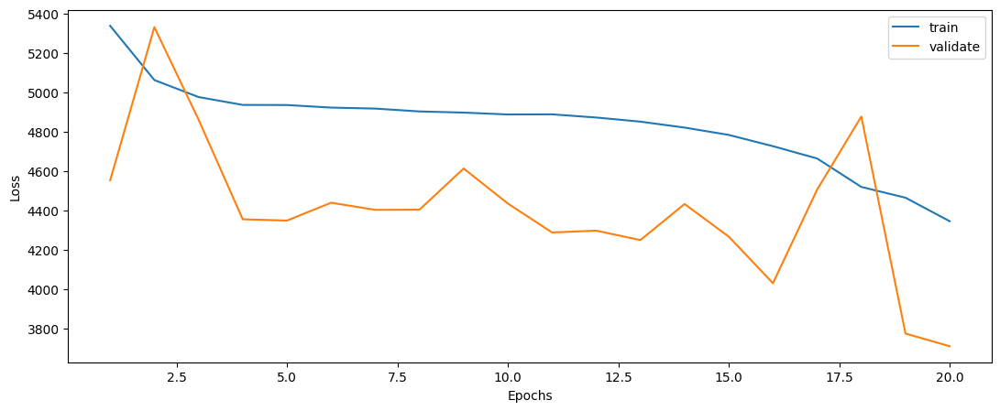

In [23]:
epochs = 20
model.compile(loss='mean_squared_error', optimizer='adam')
model.load_weights('intial_mlp.weights.h5')

history = model.fit(X_train_split
                    [train_cols], y_train_split,
                    validation_data=(X_val_split[train_cols], y_val_split),
                    epochs=epochs)

plot_loss(history)

Loss doesnt decrease significantly after epoch 3

In [24]:
# predict and evaluate
print("MLP-initial")
y_hat_train = model.predict(X_train[train_cols])
RMSE_Train, R2_Train, Score_Train = evaluate(y_train, y_hat_train, 'train')

y_hat_test = model.predict(X_test[train_cols])
RMSE_Test, R2_Test, Score_Test = evaluate(y_test, y_hat_test)

# Make Dataframe which will contain results of all applied Model
Results=pd.concat([Results,pd.DataFrame({'Model':['MLP-initial'],
                                         'RMSE-Train':[RMSE_Train],
                                         'R2-Train':[R2_Train],
                                         'Score-Train':[Score_Train],
                                         'RMSE-Test':[RMSE_Test],
                                         'R2-Test':[R2_Test],
                                         'Score-Test':[Score_Test]})]
                  ,ignore_index=True)

MLP-initial
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
train set RMSE: 63.56, R2: 0.16, Scoring Function: 47505.25
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
test set RMSE: 54.68, R2: -0.03, Scoring Function: 223.87


In [25]:
Results

,Model,RMSE-Train,R2-Train,Score-Train,RMSE-Test,R2-Test,Score-Test
0,LR,45.029737,0.576319,42990.689173,33.942725,0.601644,198.538305
1,LR-Clipped-150,27.777987,0.691029,38858.281655,31.199892,0.663423,187.043416
2,MLP-initial,63.557060,0.155951,47505.246114,54.678536,-0.033741,223.870507


Insights: Test RMSE: 49.1829 increased, lets try to test clipped data

Epoch 1/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 3236.6687 - val_loss: 2491.2227
Epoch 2/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 2624.3235 - val_loss: 2539.4526
Epoch 3/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 2589.9133 - val_loss: 2540.4138
Epoch 4/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2550.3164 - val_loss: 2543.3542
Epoch 5/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 2533.4641 - val_loss: 2450.5598
Epoch 6/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2513.7327 - val_loss: 2570.1118
Epoch 7/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2528.8918 - val_loss: 2486.6433
Epoch 8/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 2510.0601 - val_loss: 2521.0029
Epoch 9/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2491.8235 - val_loss: 2454.3472
Epoch 10/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2493.1807 - val_loss: 2407.9917
Epoch 11/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - lo

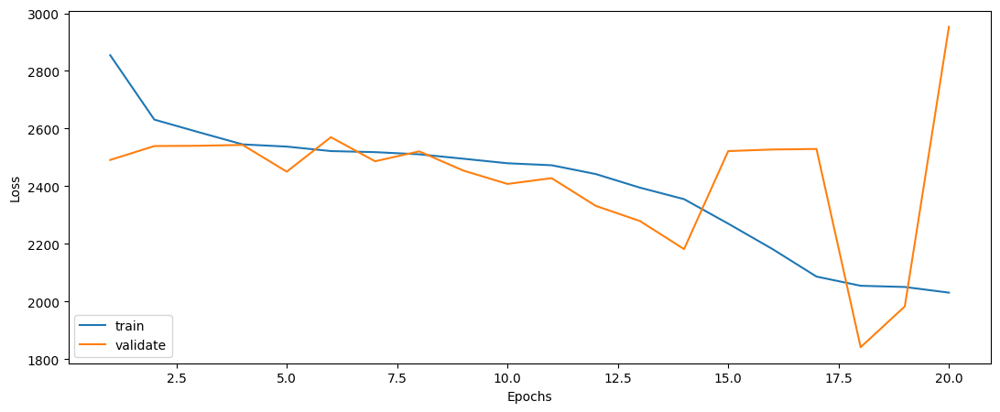

In [26]:
epochs = 20
model.compile(loss='mean_squared_error', optimizer='adam')
model.load_weights('intial_mlp.weights.h5')

history = model.fit(X_train_split
                    [train_cols], y_train_clipped_split,
                    validation_data=(X_val_split[train_cols], y_val_clipped_split),
                    epochs=epochs)

plot_loss(history)

In [27]:
# predict and evaluate
print("MLP-clipped-150")
y_hat_train = model.predict(X_train[train_cols])
RMSE_Train, R2_Train, Score_Train = evaluate(y_train_clipped, y_hat_train, 'train')

y_hat_test = model.predict(X_test[train_cols])
RMSE_Test, R2_Test, Score_Test = evaluate(y_test, y_hat_test)

# Make Dataframe which will contain results of all applied Model
Results=pd.concat([Results,pd.DataFrame({'Model':['MLP-clipped-150'],
                                         'RMSE-Train':[RMSE_Train],
                                         'R2-Train':[R2_Train],
                                         'Score-Train':[Score_Train],
                                         'RMSE-Test':[RMSE_Test],
                                         'R2-Test':[R2_Test],
                                         'Score-Test':[Score_Test]})]
                  ,ignore_index=True)

MLP-clipped-150
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
train set RMSE: 52.99, R2: -0.12, Scoring Function: 44264.51
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
test set RMSE: 61.35, R2: -0.30, Scoring Function: 230.70


In [28]:
Results

,Model,RMSE-Train,R2-Train,Score-Train,RMSE-Test,R2-Test,Score-Test
0,LR,45.029737,0.576319,42990.689173,33.942725,0.601644,198.538305
1,LR-Clipped-150,27.777987,0.691029,38858.281655,31.199892,0.663423,187.043416
2,MLP-initial,63.557060,0.155951,47505.246114,54.678536,-0.033741,223.870507
3,MLP-clipped-150,52.986669,-0.124214,44264.510172,61.348164,-0.301311,230.702126


RMSE for MLP-clipped-150 decreased to 42.209273

Epoch 1/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 3373.8608 - val_loss: 2577.8416
Epoch 2/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2606.4170 - val_loss: 2461.5784
Epoch 3/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2462.8953 - val_loss: 2399.4016
Epoch 4/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2398.2932 - val_loss: 2344.0828
Epoch 5/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2380.4453 - val_loss: 2278.3962
Epoch 6/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2264.4309 - val_loss: 2086.2837
Epoch 7/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2143.6008 - val_loss: 1964.3363
Epoch 8/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 1987.6974 - val_loss: 1738.0863
Epoch 9/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 1758.8472 - val_loss: 1475.1908
Epoch 10/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 1506.0997 - val_loss: 1457.3030
Epoch 11/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - lo

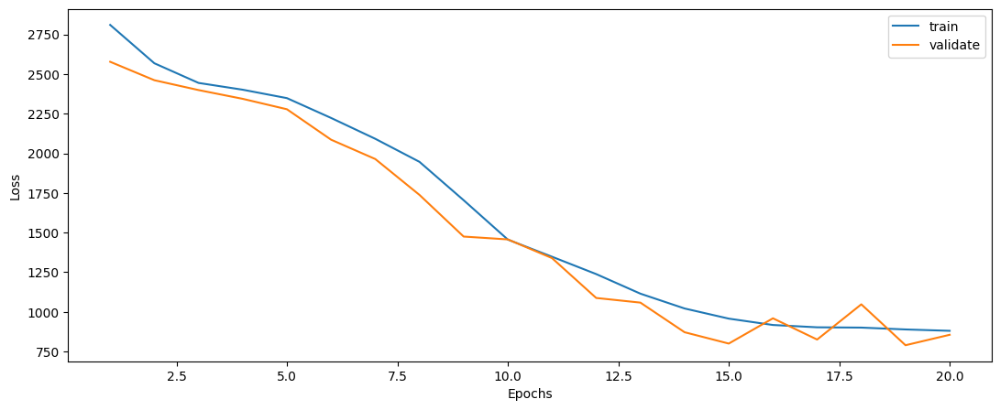

In [29]:
epochs = 20
model.compile(loss='mean_squared_error', optimizer='adam')
model.load_weights('intial_mlp.weights.h5')

history = model.fit(X_train_split_scaled[train_cols], 
                    y_train_clipped_split_scaled,
                    validation_data=(X_val_split_scaled[train_cols], 
                                      y_val_clipped_split_scaled),
                    epochs=epochs)

plot_loss(history)

In [30]:
# predict and evaluate
print("MLP-clipped-150-minmaxscale")
y_hat_train = model.predict(X_train_scaled[train_cols])
RMSE_Train, R2_Train, Score_Train = evaluate(y_train_clipped, y_hat_train, 'train')

y_hat_test = model.predict(X_test_scaled[train_cols])
RMSE_Test, R2_Test, Score_Test = evaluate(y_test, y_hat_test)

# Make Dataframe which will contain results of all applied Model
Results=pd.concat([Results,pd.DataFrame({'Model':['MLP-clipped-150-minmaxscale'],
                                         'RMSE-Train':[RMSE_Train],
                                         'R2-Train':[R2_Train],
                                         'Score-Train':[Score_Train],
                                         'RMSE-Test':[RMSE_Test],
                                         'R2-Test':[R2_Test],
                                         'Score-Test':[Score_Test]})]
                  ,ignore_index=True)

MLP-clipped-150-minmaxscale
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step  
train set RMSE: 29.12, R2: 0.66, Scoring Function: 38898.12
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
test set RMSE: 32.57, R2: 0.63, Scoring Function: 186.78


In [31]:
Results

,Model,RMSE-Train,R2-Train,Score-Train,RMSE-Test,R2-Test,Score-Test
0,LR,45.029737,0.576319,42990.689173,33.942725,0.601644,198.538305
1,LR-Clipped-150,27.777987,0.691029,38858.281655,31.199892,0.663423,187.043416
2,MLP-initial,63.557060,0.155951,47505.246114,54.678536,-0.033741,223.870507
3,MLP-clipped-150,52.986669,-0.124214,44264.510172,61.348164,-0.301311,230.702126
4,MLP-clipped-150-minmaxscale,29.119612,0.660463,38898.119401,32.571647,0.633176,186.783852


RMSE for MLP-clipped-150-minmaxscale is now 32.23, comparable to baseline
lets test with standard scaler

Epoch 1/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 3231.8223 - val_loss: 2436.2681
Epoch 2/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2397.0315 - val_loss: 2271.3901
Epoch 3/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 2248.9600 - val_loss: 1885.7218
Epoch 4/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 1860.5565 - val_loss: 1342.5780
Epoch 5/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 1350.5514 - val_loss: 1045.8573
Epoch 6/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 1131.9701 - val_loss: 1267.2533
Epoch 7/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 1018.6295 - val_loss: 914.2386
Epoch 8/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 892.8160 - val_loss: 798.4130
Epoch 9/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 853.5073 - val_loss: 848.0299
Epoch 10/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 817.6584 - val_loss: 844.4201
Epoch 11/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 812

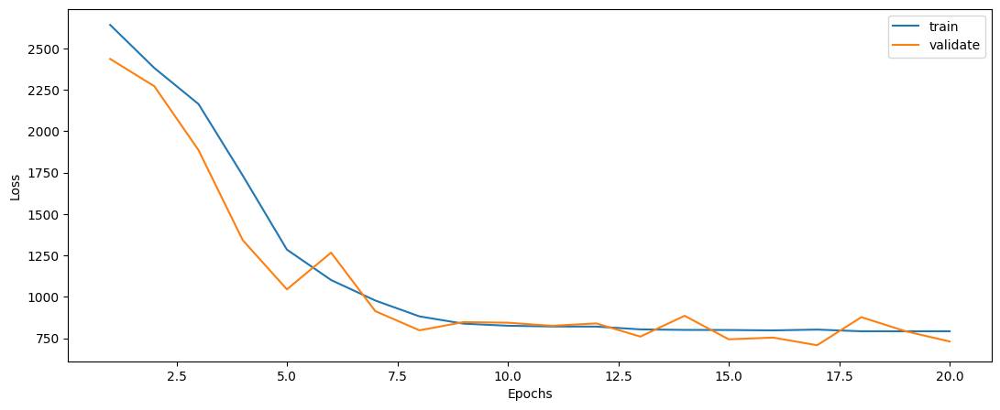

In [32]:
epochs = 20
model.compile(loss='mean_squared_error', optimizer='adam')
model.load_weights('intial_mlp.weights.h5')

history = model.fit(X_train_split_scaled2
                    [train_cols], y_train_clipped_split_scaled2,
                    validation_data=(X_val_split_scaled2[train_cols], y_val_clipped_split_scaled2),
                    epochs=epochs)

plot_loss(history)

In [33]:
# predict and evaluate
print("MLP-clipped-150-standardscale")
y_hat_train = model.predict(X_train_scaled2[train_cols])
RMSE_Train, R2_Train, Score_Train = evaluate(y_train_clipped, y_hat_train, 'train')

y_hat_test = model.predict(X_test_scaled2[train_cols])
RMSE_Test, R2_Test, Score_Test = evaluate(y_test, y_hat_test)

# Make Dataframe which will contain results of all applied Model
Results=pd.concat([Results,pd.DataFrame({'Model':['MLP-clipped-150-standardscale'],
                                         'RMSE-Train':[RMSE_Train],
                                         'R2-Train':[R2_Train],
                                         'Score-Train':[Score_Train],
                                         'RMSE-Test':[RMSE_Test],
                                         'R2-Test':[R2_Test],
                                         'Score-Test':[Score_Test]})]
                  ,ignore_index=True)

MLP-clipped-150-standardscale
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step  
train set RMSE: 28.73, R2: 0.67, Scoring Function: 38388.06
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
test set RMSE: 31.38, R2: 0.66, Scoring Function: 172.02


In [34]:
Results

,Model,RMSE-Train,R2-Train,Score-Train,RMSE-Test,R2-Test,Score-Test
0,LR,45.029737,0.576319,42990.689173,33.942725,0.601644,198.538305
1,LR-Clipped-150,27.777987,0.691029,38858.281655,31.199892,0.663423,187.043416
2,MLP-initial,63.557060,0.155951,47505.246114,54.678536,-0.033741,223.870507
3,MLP-clipped-150,52.986669,-0.124214,44264.510172,61.348164,-0.301311,230.702126
4,MLP-clipped-150-minmaxscale,29.119612,0.660463,38898.119401,32.571647,0.633176,186.783852
5,MLP-clipped-150-standardscale,28.727562,0.669544,38388.057002,31.377979,0.659570,172.022057


Using standard scaling, it further improved RMSE to 30.4608

### Condition based standardization

As observed earlier, there are  6 different operating conditions present. Thus, with reference to K. Peters, we tested out scaling the data by their conditions.

[2] K. Peters, "Lagged MLP for Predictive Maintenance of Turbofan Engines," Towards Data Science, Date Published. [Online]. Available: https://towardsdatascience.com/lagged-mlp-for-predictive-maintenance-of-turbofan-engines-c79f02a15329.


In [35]:
def add_operating_condition(df):
    df_op_cond = df.copy()
    
    df_op_cond['setting_1'] = df_op_cond['setting_1'].round()
    df_op_cond['setting_2'] = df_op_cond['setting_2'].round(decimals=2)
    
    # converting settings to string and concatanating makes the operating condition into a categorical variable
    df_op_cond['op_cond'] = df_op_cond['setting_1'].astype(str) + '_' + \
                        df_op_cond['setting_2'].astype(str) + '_' + \
                        df_op_cond['setting_3'].astype(str)
    
    return df_op_cond


In [36]:
X_train_condition = add_operating_condition(train)
X_test_condition = add_operating_condition(X_test)


In [37]:
op_cond = list(X_train_condition['op_cond'].unique())
op_cond


['35.0_0.84_100.0',
 '42.0_0.84_100.0',
 '25.0_0.62_60.0',
 '20.0_0.7_100.0',
 '0.0_0.0_100.0',
 '10.0_0.25_100.0']

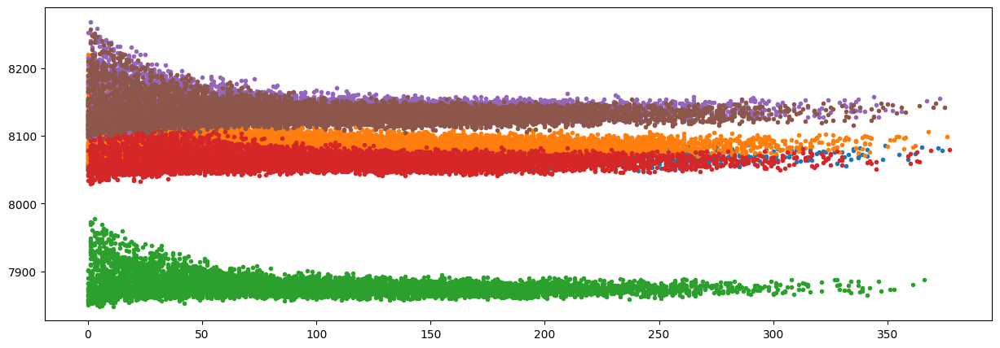

In [38]:
plt.figure(figsize=(15,5))

for condition in op_cond:
    data = X_train_condition.loc[X_train_condition['op_cond']==condition]
    plt.plot(data['RUL'], data['S14(Corrected core speed) (rpm)'], '.')

In [39]:
def condition_scaler(df_train, df_test, sensor_names):
    # apply operating condition specific scaling
    scaler = StandardScaler()
    for condition in df_train['op_cond'].unique():
        scaler.fit(df_train.loc[df_train['op_cond']==condition, sensor_names])
        df_train.loc[df_train['op_cond']==condition, sensor_names] = scaler.transform(df_train.loc[df_train['op_cond']==condition, sensor_names])
        df_test.loc[df_test['op_cond']==condition, sensor_names] = scaler.transform(df_test.loc[df_test['op_cond']==condition, sensor_names])
    return df_train, df_test


In [40]:
X_train_condition_scaled, X_test_condition_scaled = condition_scaler(X_train_condition, X_test_condition, sensor_names)
X_test_condition_scaled.head()


/tmp/ipykernel_18/4154894558.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[-0.1674041  -1.59188977 -0.1674041  ...  0.54483874  1.96932442
  2.68156725]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_train.loc[df_train['op_cond']==condition, sensor_names] = scaler.transform(df_train.loc[df_train['op_cond']==condition, sensor_names])
/tmp/ipykernel_18/4154894558.py:7: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[-1.59188977 -0.87964693  0.54483874 -0.1674041  -1.59188977 -0.1674041
  1.96932442 -0.87964693 -0.87964693  0.54483874 -0.1674041   0.54483874
 -0.1674041  -0.1674041  -0.87964693 -0.87964693 -1.59188977  0.54483874
 -0.1674041   1.25708158  0.54483874 -0.1674041   0.54483874  1.25708158
  0.54483874  1.25708158 -0.87964693 -0.1674041  -0.87964693 -0.1674041
  

,setting_1,setting_2,setting_3,S1(Fan inlet temperature) (◦R),S2(LPC outlet temperature) (◦R),S3(HPC outlet temperature) (◦R),S4(LPT outlet temperature) (◦R),S5(Fan inlet Pressure) (psia),S6(bypass-duct pressure) (psia),S7(HPC outlet pressure) (psia),...,S13(Corrected fan speed) (rpm),S14(Corrected core speed) (rpm),S15(Bypass Ratio),S16(Burner fuel-air ratio),S17(Bleed Enthalpy),S18(Required fan speed),S19(Required fan conversion speed),S20(High-pressure turbines Cool air flow),S21(Low-pressure turbines Cool air flow),op_cond
engine,,,,,,,,,,,,,,,,,,,,,
1,10.0,0.25,100.0,-1.136868e-13,1.067757,2.243249,1.633786,0.000000e+00,1.429549,-1.109478,...,1.619153,1.993314,2.120741,-1.387779e-17,0.873173,0,0.0,-1.571362,-0.260551,10.0_0.25_100.0
2,0.0,0.00,100.0,0.000000e+00,-0.017587,0.207384,1.041724,-3.552714e-15,0.131140,-0.000836,...,0.290831,-0.214174,-0.472348,-1.387779e-17,-0.130505,0,0.0,0.014174,0.533134,0.0_0.0_100.0
3,35.0,0.84,100.0,5.684342e-14,0.138436,0.695713,0.548449,-1.776357e-15,-0.174690,0.286740,...,-0.227555,-0.062787,-0.600083,3.469447e-18,-1.591890,0,0.0,-0.713689,0.908522,35.0_0.84_100.0
4,20.0,0.70,100.0,2.273737e-13,0.918094,0.406796,0.560935,1.776357e-15,0.713320,-0.176094,...,-0.263652,-0.232749,0.056746,-5.221511e-01,-0.262250,0,0.0,-1.734068,0.108079,20.0_0.7_100.0
5,42.0,0.84,100.0,0.000000e+00,2.553217,0.796509,1.641733,1.332268e-15,0.844057,-0.479111,...,3.116996,3.125538,0.568977,3.469447e-18,1.372567,0,0.0,-2.283410,0.137583,42.0_0.84_100.0


In [41]:
def plot_signal(df, signal_name, engine=None):
    plt.figure(figsize=(13,5))
    
    if engine:
        # Plot data for a specific engine
        plt.plot('RUL', signal_name, 
                 data=df[df['engine']==engine], label=f'Engine {engine}')
    else:
        # Plot data for multiple engines
        for i in df['engine'].unique():
            if (i % 10 == 0):  # only plotting every 10th engine
                plt.plot('RUL', signal_name, 
                         data=df[df['engine']==i], label=f'Engine {i}')
    
    plt.xlim(250, 0)  # Reverse the x-axis so RUL counts down to zero
    plt.xticks(np.arange(0, 275, 25))
    plt.ylabel(signal_name)
    plt.xlabel('Remaining Useful Life')

    # Position the legend at the bottom of the plot
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)
    
    plt.show()


# def plot_signal(df, signal_name, engine=None):
#     plt.figure(figsize=(13,5))
    
#     if engine:
#         plt.plot('RUL', signal_name, 
#                 data=df[df['engine']==engine])
#     else:
#         for i in train['engine'].unique():
#             if (i % 10 == 0):  # only ploting every 10th unit_nr
#                 plt.plot('RUL', signal_name, 
#                          data=df[df['engine']==i])
#     plt.xlim(250, 0)  # reverse the x-axis so RUL counts down to zero
#     plt.xticks(np.arange(0, 275, 25))
#     plt.ylabel(signal_name)
#     plt.xlabel('Remaining Use fulLife')
#     plt.show()


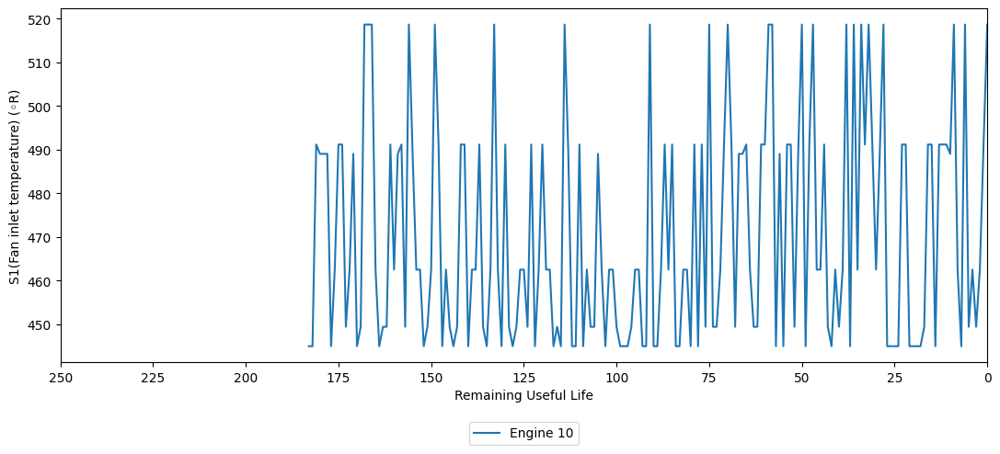

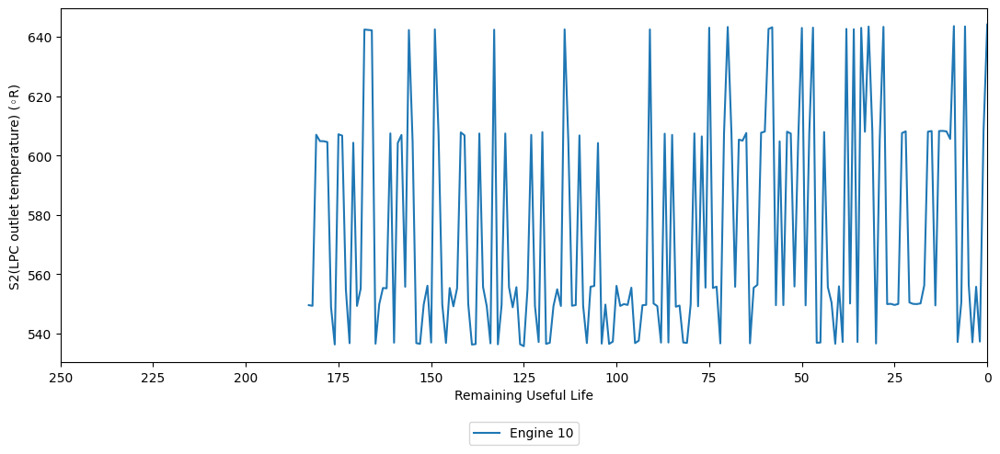

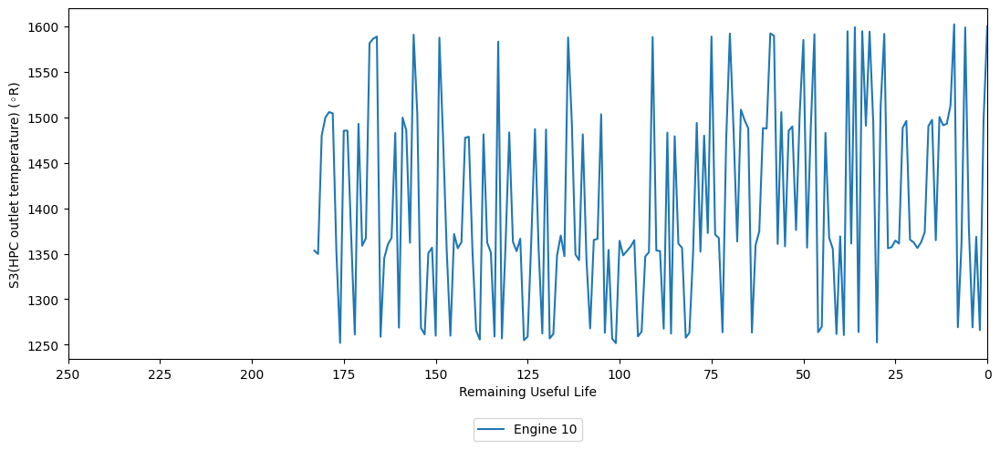

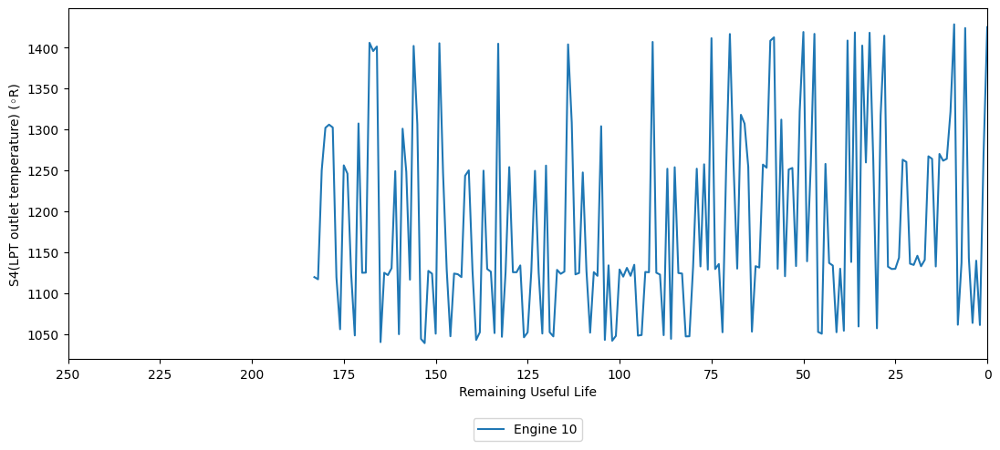

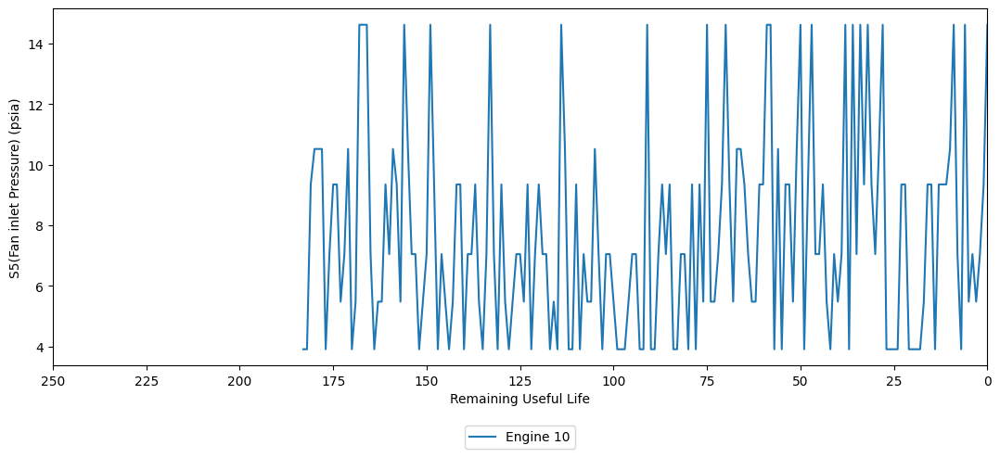

...

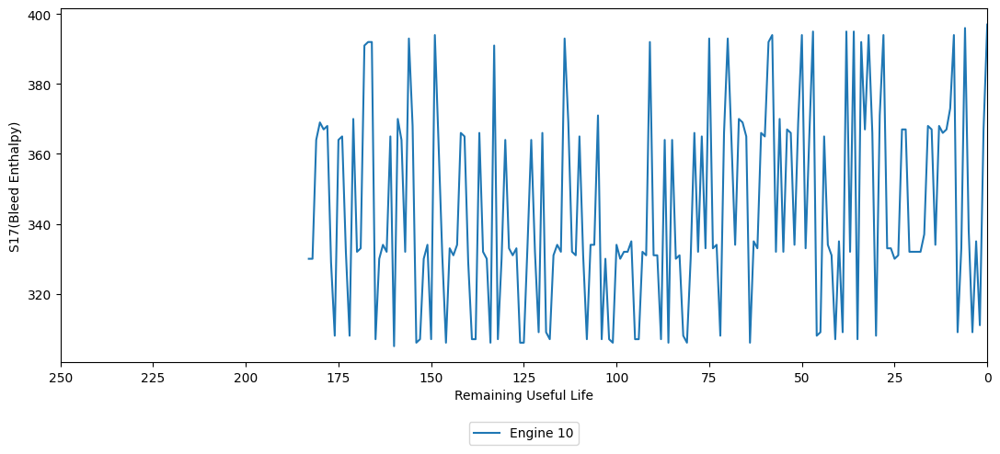

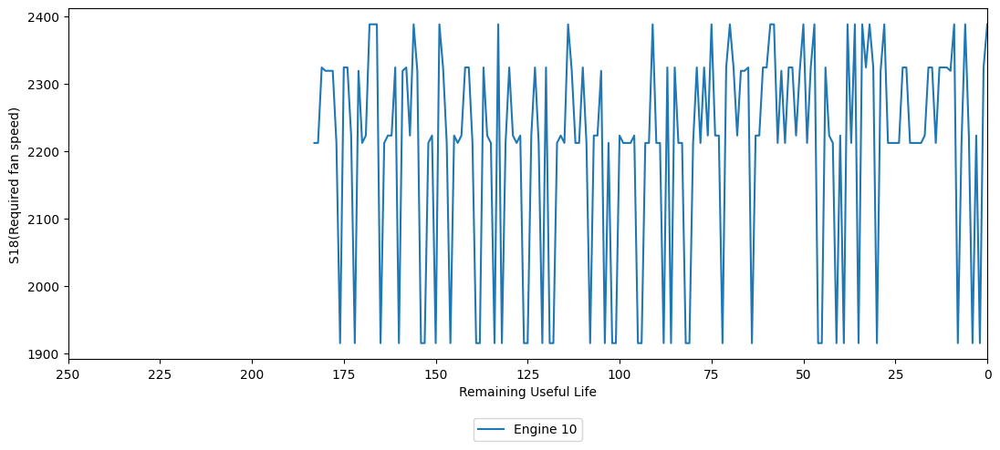

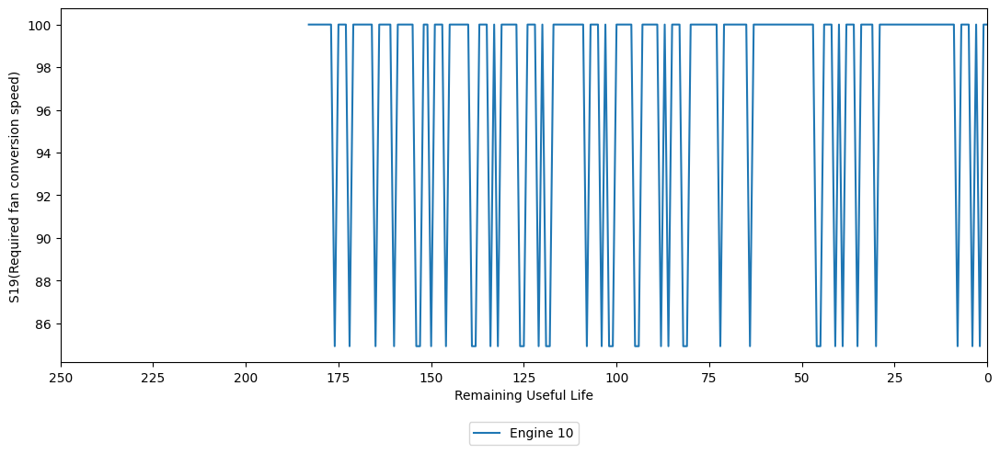

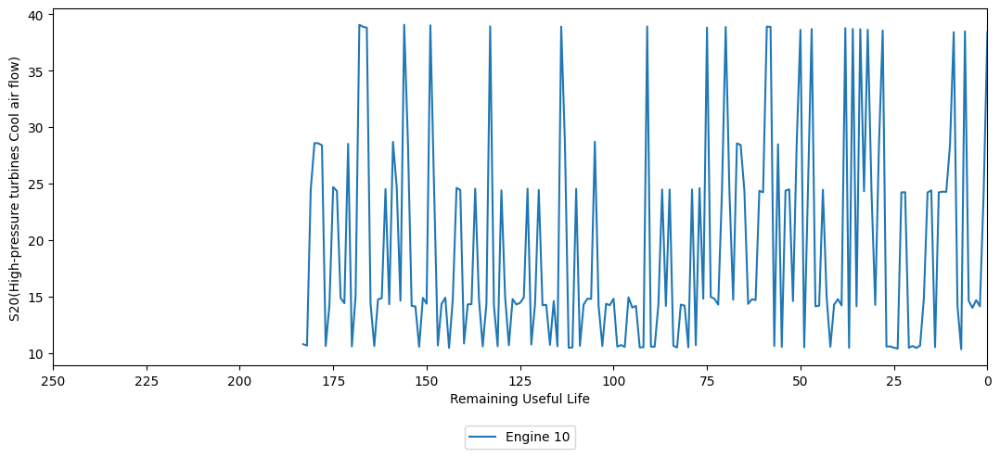

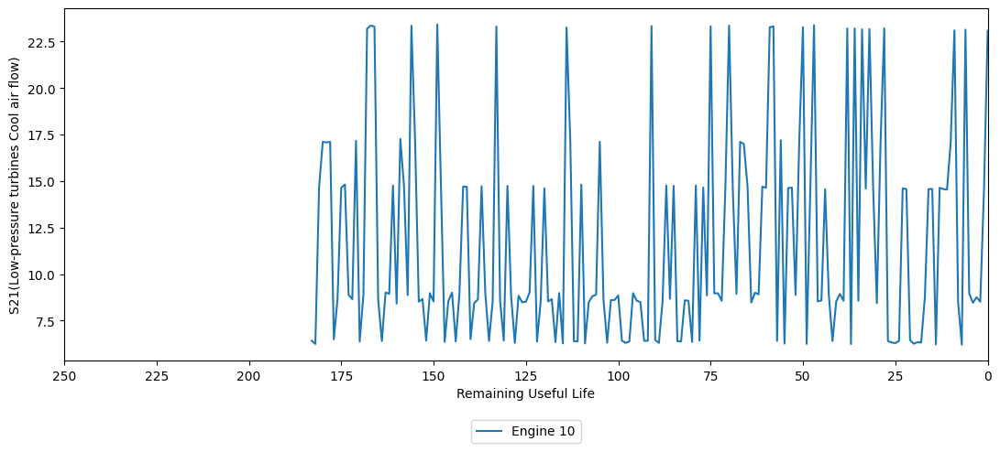

In [42]:
for sensor in sensor_names:  # compare train vs condition scaled
    plot_signal(train, sensor, engine=10)


In [43]:
X_train_condition_scaled

,engine,cycle,setting_1,setting_2,setting_3,S1(Fan inlet temperature) (◦R),S2(LPC outlet temperature) (◦R),S3(HPC outlet temperature) (◦R),S4(LPT outlet temperature) (◦R),S5(Fan inlet Pressure) (psia),...,S14(Corrected core speed) (rpm),S15(Bypass Ratio),S16(Burner fuel-air ratio),S17(Bleed Enthalpy),S18(Required fan speed),S19(Required fan conversion speed),S20(High-pressure turbines Cool air flow),S21(Low-pressure turbines Cool air flow),RUL,op_cond
0,1,1,35.0,0.84,100.0,5.684342e-14,-1.090341,-1.443080,0.770031,-1.776357e-15,...,-1.531618,0.361688,3.469447e-18,-0.167404,0,0.000000e+00,-0.890407,-1.352348,148,35.0_0.84_100.0
1,1,2,42.0,0.84,100.0,0.000000e+00,0.450794,-0.220659,-0.264837,1.332268e-15,...,-1.040095,0.062511,3.469447e-18,-0.757098,0,0.000000e+00,-1.634765,-1.315594,147,42.0_0.84_100.0
2,1,3,25.0,0.62,60.0,0.000000e+00,1.242458,-1.122073,-0.421669,1.776357e-15,...,-1.042345,-0.459720,0.000000e+00,1.277815,0,-1.421085e-14,-1.631373,1.720463,146,25.0_0.62_60.0
3,1,4,42.0,0.84,100.0,0.000000e+00,-0.450245,-0.076871,-0.186270,1.332268e-15,...,-1.261000,-0.593229,3.469447e-18,-1.466987,0,0.000000e+00,0.033181,1.845375,145,42.0_0.84_100.0
4,1,5,25.0,0.62,60.0,0.000000e+00,0.572265,-0.942156,-0.351169,1.776357e-15,...,-1.321497,-0.408803,0.000000e+00,1.277815,0,-1.421085e-14,-1.185251,-0.451156,144,25.0_0.62_60.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53754,260,312,20.0,0.70,100.0,2.273737e-13,2.645665,1.731395,2.103295,1.776357e-15,...,6.858276,1.817660,1.915154e+00,2.465893,0,0.000000e+00,-0.697438,-1.929249,4,20.0_0.7_100.0
53755,260,313,10.0,0.25,100.0,-1.136868e-13,1.889726,2.125800,1.521453,0.000000e+00,...,6.881016,2.461214,-1.387779e-17,2.887767,0,0.000000e+00,-2.960199,-1.985342,3,10.0_0.25_100.0
53756,260,314,25.0,0.62,60.0,0.000000e+00,1.717179,2.567172,1.116121,1.776357e-15,...,7.115940,3.511765,0.000000e+00,2.051387,0,-1.421085e-14,-0.649904,-0.123222,2,25.0_0.62_60.0
53757,260,315,25.0,0.62,60.0,0.000000e+00,2.722469,1.944091,2.346940,1.776357e-15,...,7.209501,3.234039,0.000000e+00,2.824959,0,-1.421085e-14,-1.899046,-2.804122,1,25.0_0.62_60.0


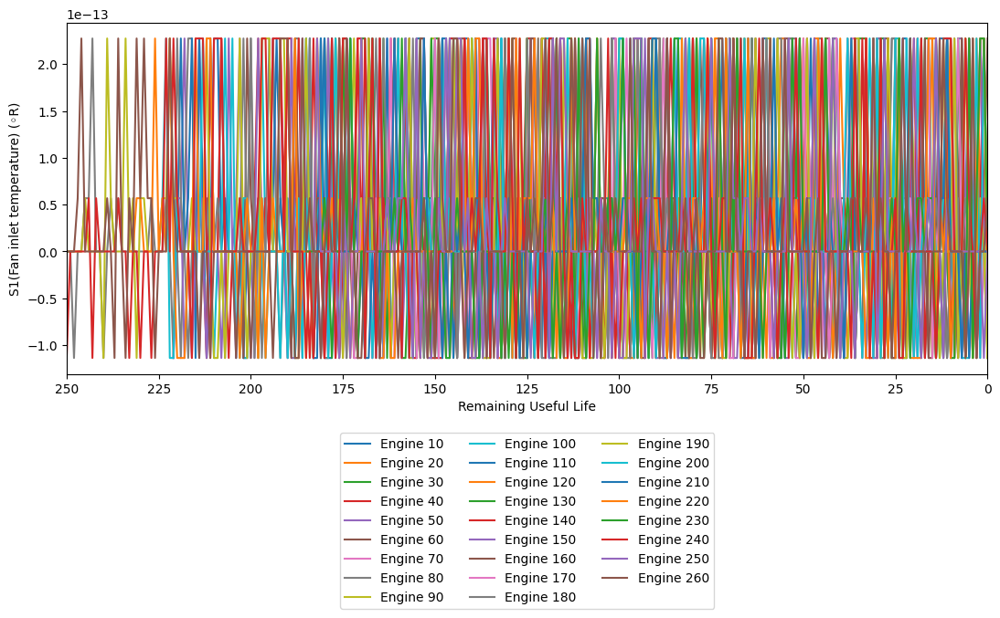

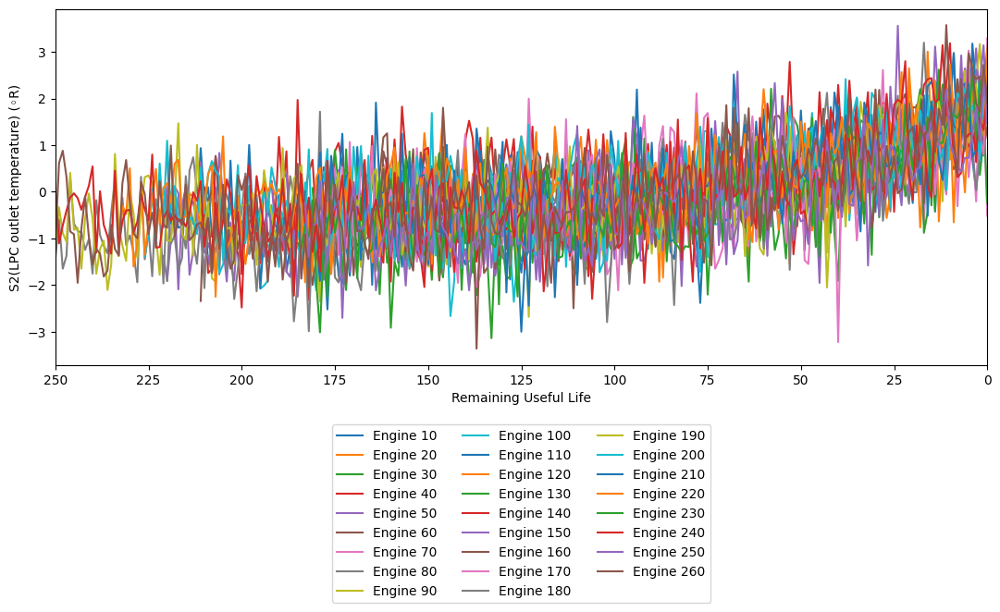

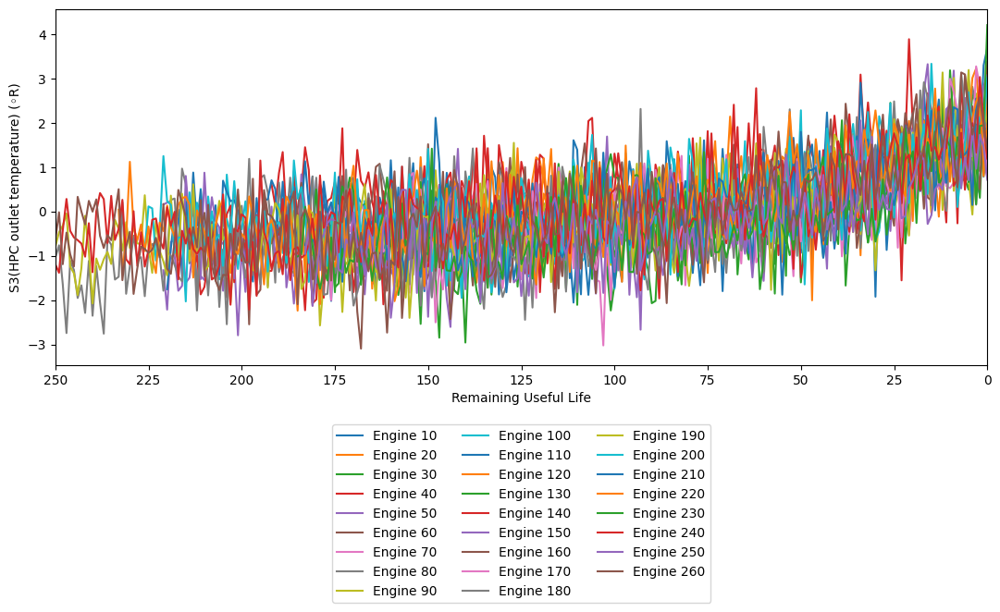

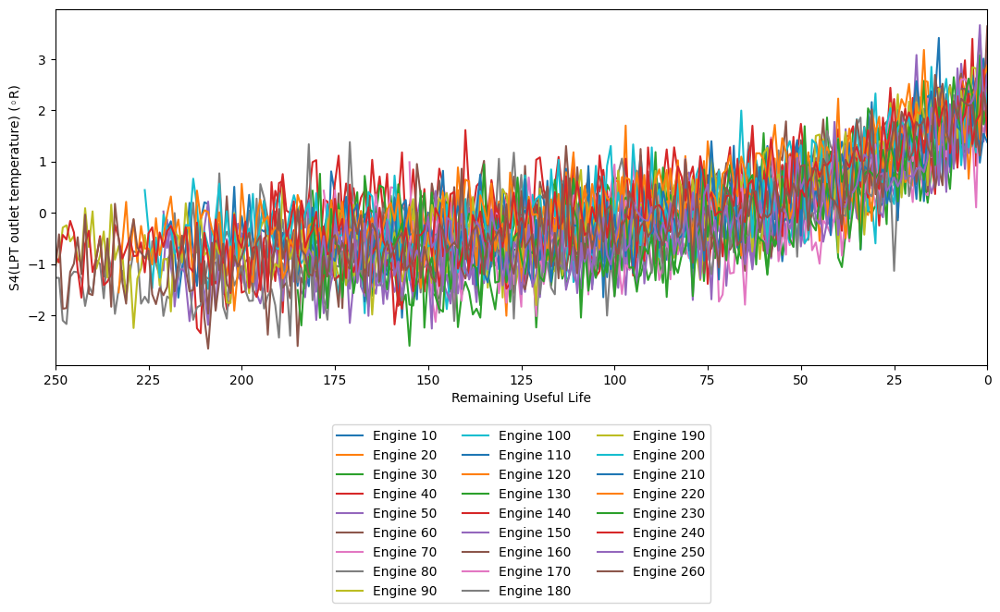

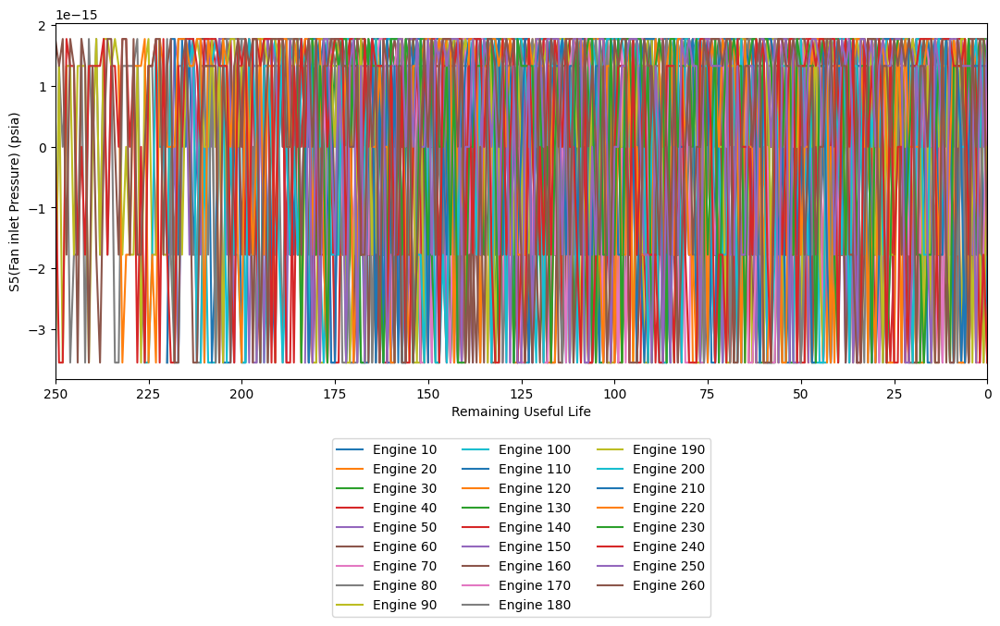

...

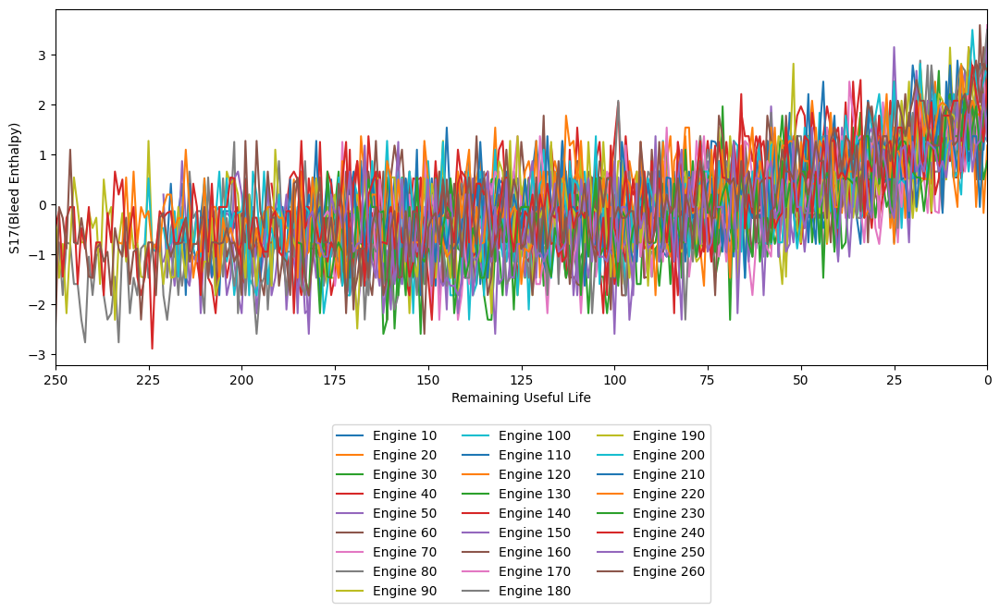

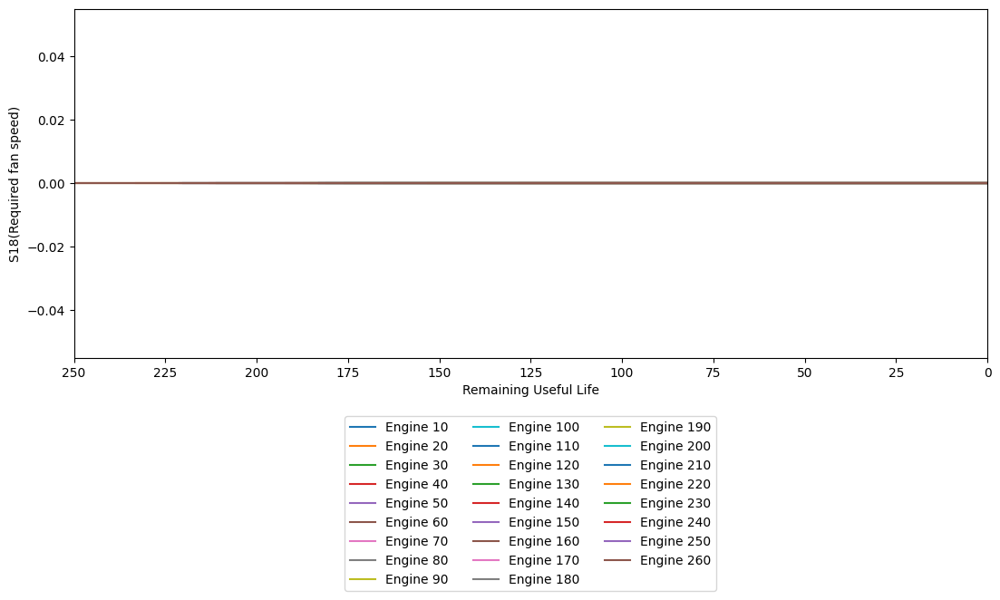

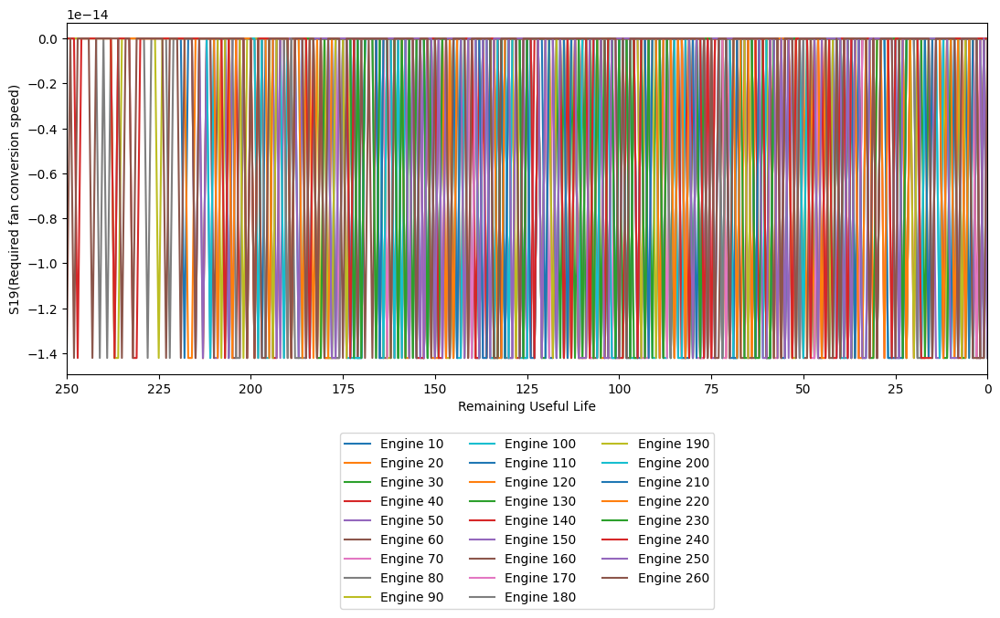

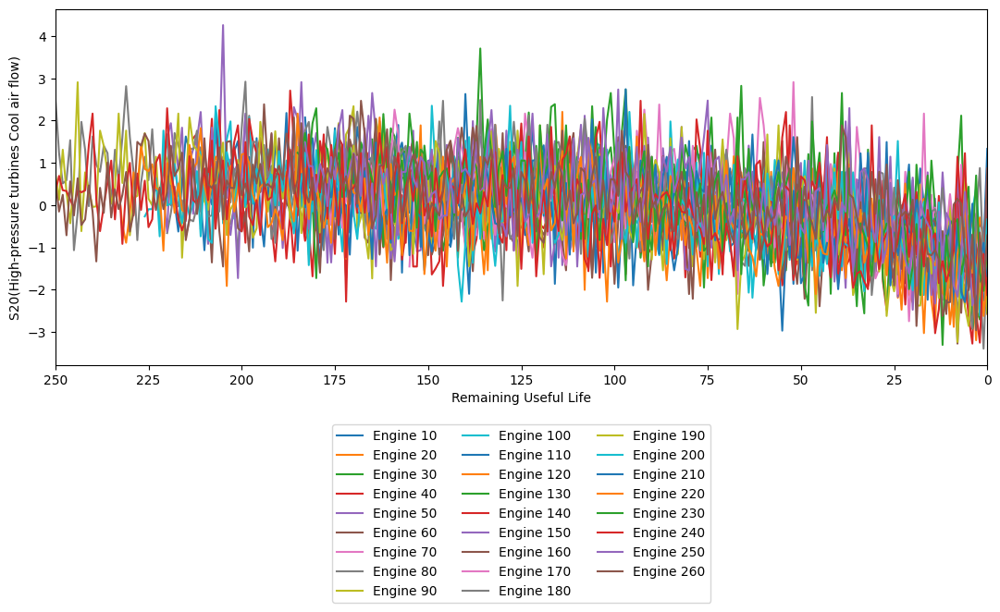

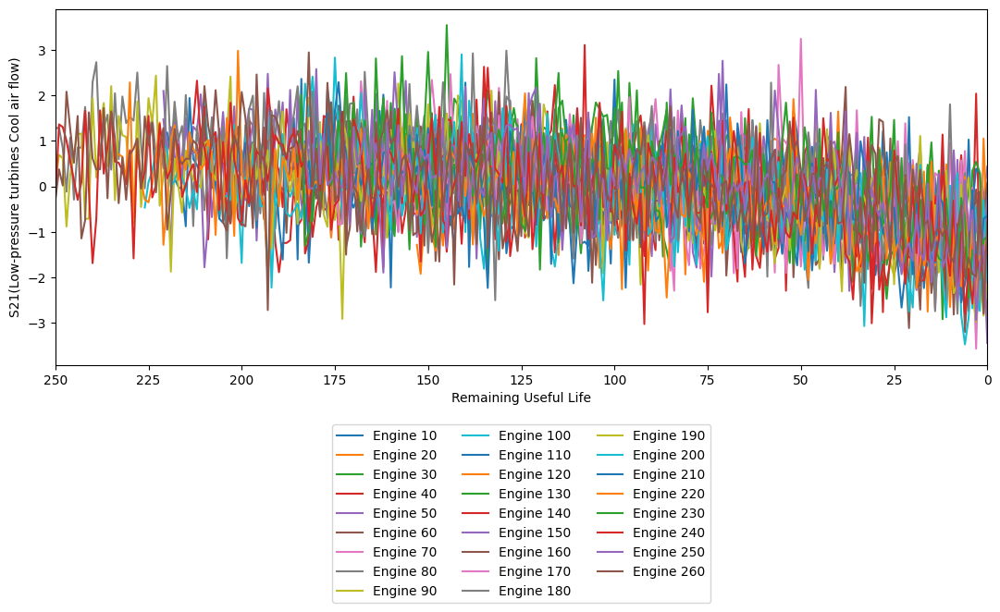

In [44]:
for sensor in sensor_names:
    plot_signal(X_train_condition_scaled, sensor)


In [45]:
# fig, axs = plt.subplots(nrows=n_pairs, ncols=2, figsize=(10, 2 * n_pairs))

# for i in range(n_pairs):
#     # Plot on the left column
#     axs[i, 0].plot(data_set_1[i])
#     axs[i, 0].set_title(f'Set 1 Plot {i+1}')
#     axs[i, 0].set_xlabel('X-axis')
#     axs[i, 0].set_ylabel('Y-axis')
    
#     # Plot on the right column
#     axs[i, 1].plot(data_set_2[i])
#     axs[i, 1].set_title(f'Set 2 Plot {i+1}')
#     axs[i, 1].set_xlabel('X-axis')
#     axs[i, 1].set_ylabel('Y-axis')

# # Adjust layout to prevent overlap
# plt.tight_layout()

# # Display the plots
# plt.show()

Sensor 1 5 6 10 16 and 19 does not portray any relationship between readings and RUL
Sensor 2, 3, 4, 11, 15 and 17 portrays a positive(gradient) relationship between readings and RUL
Sensor 7, 12, 20 and 21 portrays a negative(gradient) relationship between readings and RUL
Sensor 8, 9, 13 and 14 shows the spread in RUL (varailibity) increaess as the reading moves away from mean.
Sensor 18 doesnt change after condition standardization. 

In [46]:
remaining_sensors = ['S2(LPC outlet temperature) (◦R)', 
                     'S3(HPC outlet temperature) (◦R)', 
                     'S4(LPT outlet temperature) (◦R)', 
                     'S7(HPC outlet pressure) (psia)', 
                     'S8(Physical fan speed) (rpm)',
                     'S9(Physical core speed) (rpm)',
                     'S11(HPC outlet Static pressure) (psia)', 
                     'S12(Ratio of fuel flow to Ps30) (pps/psia)', 
                     'S13(Corrected fan speed) (rpm)', 
                     'S14(Corrected core speed) (rpm)', 
                     'S15(Bypass Ratio) ', 
                     'S17(Bleed Enthalpy)', 
                     'S20(High-pressure turbines Cool air flow)', 
                     'S21(Low-pressure turbines Cool air flow)']

drop_sensors = [element for element in sensor_names if element not in remaining_sensors]
drop_sensors  

# ['(Fan inlet temperature) (◦R)',
#  '(Fan inlet Pressure) (psia)',
#  '(bypass-duct pressure) (psia)',
#  '(Engine pressure ratio) (P50/P2)',
#  '(Burner fuel-air ratio)',
#  '(Required fan speed)',
#  '(Required fan conversion speed)']


['S1(Fan inlet temperature) (◦R)',
 'S5(Fan inlet Pressure) (psia)',
 'S6(bypass-duct pressure) (psia)',
 'S10(Engine pressure ratio) (P50/P2)',
 'S16(Burner fuel-air ratio)',
 'S18(Required fan speed)',
 'S19(Required fan conversion speed)']

In [47]:
split_result = train_val_group_split(X_train_condition_scaled, y_train_clipped, train['engine'], print_groups=False)
X_train_split_condition_scaled, y_train_clipped_split_condition_scaled = split_result[:2]
X_val_split_condition_scaled, y_val_clipped_split_condition_scaled = split_result[2:]

Epoch 1/20


/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1359/1359 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 3839.4592 - val_loss: 742.4510
Epoch 2/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 796.1984 - val_loss: 648.1727
Epoch 3/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 702.7328 - val_loss: 653.3869
Epoch 4/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 683.0148 - val_loss: 661.0826
Epoch 5/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 665.8562 - val_loss: 661.4037
Epoch 6/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 656.1031 - val_loss: 629.8802
Epoch 7/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 654.9973 - val_loss: 638.4507
Epoch 8/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 647.6497 - val_loss: 650.4083
Epoch 9/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 644.4446 - val_loss: 689.1809
Epoch 10/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 649.1173 - val_loss: 656.2316
Epoch 11/20
1359/1359 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 651.6289 - val_loss: 638.9

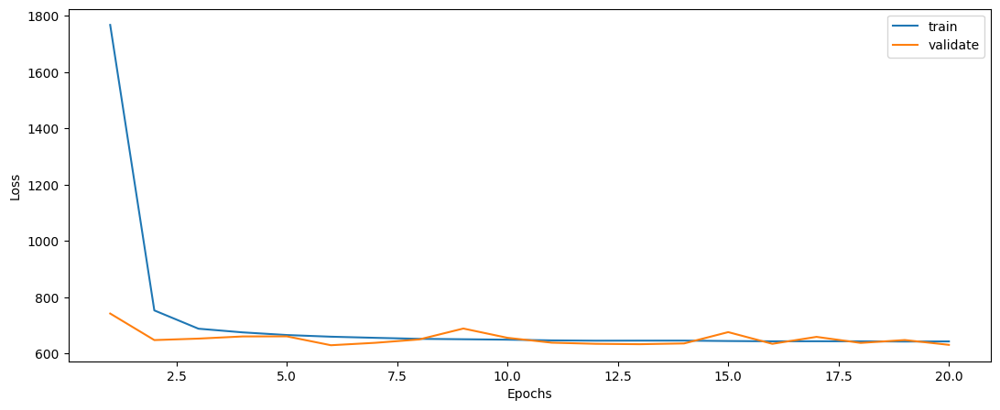

In [48]:
# we have to redefine our model as our inputs changed
input_dim = len(X_train_split_condition_scaled[remaining_sensors].columns)

model = Sequential()
model.add(Dense(16, input_dim=input_dim, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.save_weights('condition_normalized_weights_remaining_sensors.weights.h5')


model.compile(loss='mean_squared_error', optimizer='adam')
model.load_weights('condition_normalized_weights_remaining_sensors.weights.h5')

history = model.fit(X_train_split_condition_scaled[remaining_sensors], y_train_clipped_split_condition_scaled,
                    validation_data=(X_val_split_condition_scaled[remaining_sensors], y_val_clipped_split_condition_scaled),
                    epochs=epochs)

plot_loss(history)

In [49]:
# predict and evaluate
print("MLP-clipped-150-conditon-std")

y_hat_train = model.predict(X_train_condition_scaled[remaining_sensors])
evaluate(y_train_clipped, y_hat_train, 'train')
RMSE_Train, R2_Train, Score_Train = evaluate(y_train_clipped, y_hat_train, 'train')

y_hat_test = model.predict(X_test_condition_scaled[remaining_sensors])
RMSE_Test, R2_Test, Score_Test = evaluate(y_test, y_hat_test)

# Make Dataframe which will contain results of all applied Model
Results=pd.concat([Results,pd.DataFrame({'Model':['MLP-clipped-150-conditon-std'],
                                         'RMSE-Train':[RMSE_Train],
                                         'R2-Train':[R2_Train],
                                         'Score-Train':[Score_Train],
                                         'RMSE-Test':[RMSE_Test],
                                         'R2-Test':[R2_Test],
                                         'Score-Test':[Score_Test]})]
                  ,ignore_index=True)

MLP-clipped-150-conditon-std
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
train set RMSE: 25.31, R2: 0.74, Scoring Function: 36312.44
train set RMSE: 25.31, R2: 0.74, Scoring Function: 36312.44
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
test set RMSE: 28.02, R2: 0.73, Scoring Function: 166.81


In [50]:
Results

,Model,RMSE-Train,R2-Train,Score-Train,RMSE-Test,R2-Test,Score-Test
0,LR,45.029737,0.576319,42990.689173,33.942725,0.601644,198.538305
1,LR-Clipped-150,27.777987,0.691029,38858.281655,31.199892,0.663423,187.043416
2,MLP-initial,63.557060,0.155951,47505.246114,54.678536,-0.033741,223.870507
3,MLP-clipped-150,52.986669,-0.124214,44264.510172,61.348164,-0.301311,230.702126
4,MLP-clipped-150-minmaxscale,29.119612,0.660463,38898.119401,32.571647,0.633176,186.783852
5,MLP-clipped-150-standardscale,28.727562,0.669544,38388.057002,31.377979,0.659570,172.022057
6,MLP-clipped-150-conditon-std,25.311602,0.743460,36312.441135,28.020404,0.728527,166.810576


MLP-clipped-150-conditon-std, RMSE decreased to 27.829288

#### XGBoost

In [51]:
# Function to plot training and validation loss
def plot_training_validation_loss(results):
    epochs = len(results['validation_0']['rmse'])
    x_axis = range(0, epochs)

    plt.figure(figsize=(10, 6))
    plt.plot(x_axis, results['validation_0']['rmse'], label='Train')
    plt.plot(x_axis, results['validation_1']['rmse'], label='Validation')
    plt.xlabel('Epochs')
    plt.ylabel('RMSE')
    plt.title('XGBoost RMSE')
    plt.legend()
    plt.grid(True)
    plt.show()

#### XGBoost with original data

train set RMSE: 50.09, R2: 0.48, Scoring Function: 45394.60
test set RMSE: 36.24, R2: 0.55, Scoring Function: 215.55


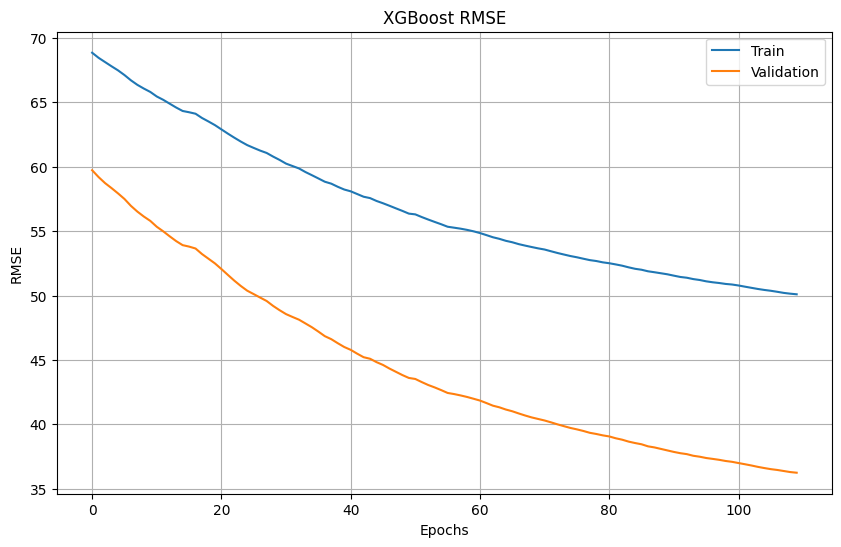

In [52]:
# Define the model
xgb = xg.XGBRegressor(n_estimators=110, learning_rate=0.02, gamma=0, subsample=0.8, colsample_bytree=0.5, max_depth=3,eval_metric="rmse")

eval_set = [(X_train, y_train), (X_test, y_test)]
xgb.fit(X_train, y_train, eval_set=eval_set, verbose=False)
results = xgb.evals_result()

# predict and evaluate
y_hat_train = xgb.predict(X_train)
RMSE_Train, R2_Train, Score_Train = evaluate(y_train, y_hat_train, 'train')

y_hat_test = xgb.predict(X_test)
RMSE_Test, R2_Test, Score_Test = evaluate(y_test, y_hat_test)

# Make Dataframe which will contain results of all applied Model
Results = pd.concat([Results, pd.DataFrame({'Model': ['XGB-Initial'],
                                            'RMSE-Train': [RMSE_Train],
                                            'R2-Train': [R2_Train],
                                            'Score-Train': [Score_Train],
                                            'RMSE-Test': [RMSE_Test],
                                            'R2-Test': [R2_Test],
                                            'Score-Test': [Score_Test]})]
                    , ignore_index=True)

# Plot training and validation loss
plot_training_validation_loss(results)

In [53]:
Results

,Model,RMSE-Train,R2-Train,Score-Train,RMSE-Test,R2-Test,Score-Test
0,LR,45.029737,0.576319,42990.689173,33.942725,0.601644,198.538305
1,LR-Clipped-150,27.777987,0.691029,38858.281655,31.199892,0.663423,187.043416
2,MLP-initial,63.557060,0.155951,47505.246114,54.678536,-0.033741,223.870507
3,MLP-clipped-150,52.986669,-0.124214,44264.510172,61.348164,-0.301311,230.702126
4,MLP-clipped-150-minmaxscale,29.119612,0.660463,38898.119401,32.571647,0.633176,186.783852
5,MLP-clipped-150-standardscale,28.727562,0.669544,38388.057002,31.377979,0.659570,172.022057
6,MLP-clipped-150-conditon-std,25.311602,0.743460,36312.441135,28.020404,0.728527,166.810576
7,XGB-Initial,50.093756,0.475667,45394.596051,36.236469,0.545986,215.549601


#### XGBoost with clipped data

train set RMSE: 32.25, R2: 0.58, Scoring Function: 44137.43
test set RMSE: 34.95, R2: 0.58, Scoring Function: 206.73


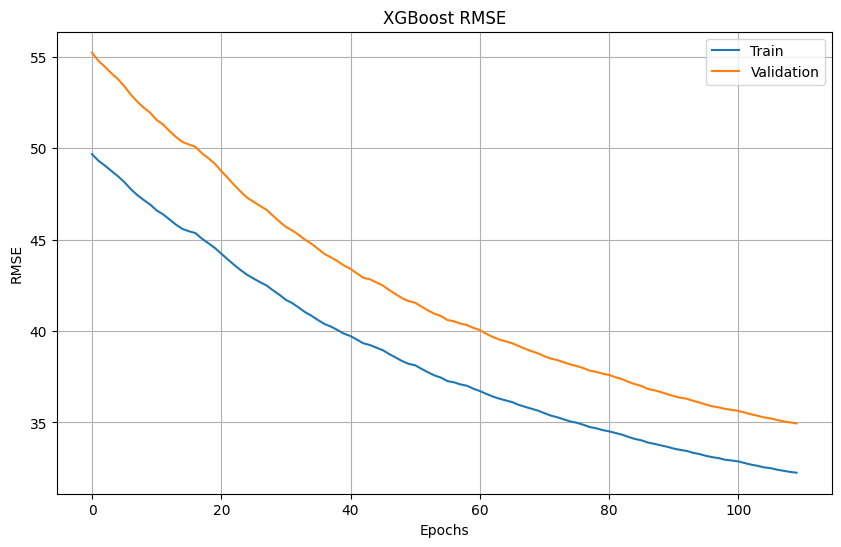

In [54]:
eval_set = [(X_train, y_train_clipped), (X_test, y_test)]
xgb.fit(X_train, y_train_clipped, eval_set=eval_set, verbose=False)
results = xgb.evals_result()

# predict and evaluate
y_hat_train = xgb.predict(X_train)
RMSE_Train, R2_Train, Score_Train = evaluate(y_train_clipped, y_hat_train, 'train')

y_hat_test = xgb.predict(X_test)
RMSE_Test, R2_Test, Score_Test = evaluate(y_test, y_hat_test)

# Make Dataframe which will contain results of all applied Model
Results=pd.concat([Results,pd.DataFrame({'Model':['XGB-clipped-150'],
                                         'RMSE-Train':[RMSE_Train],
                                         'R2-Train':[R2_Train],
                                         'Score-Train':[Score_Train],
                                         'RMSE-Test':[RMSE_Test],
                                         'R2-Test':[R2_Test],
                                         'Score-Test':[Score_Test]})]
                  ,ignore_index=True)

# Plot training and validation loss
plot_training_validation_loss(results)

In [55]:
Results

,Model,RMSE-Train,R2-Train,Score-Train,RMSE-Test,R2-Test,Score-Test
0,LR,45.029737,0.576319,42990.689173,33.942725,0.601644,198.538305
1,LR-Clipped-150,27.777987,0.691029,38858.281655,31.199892,0.663423,187.043416
2,MLP-initial,63.557060,0.155951,47505.246114,54.678536,-0.033741,223.870507
3,MLP-clipped-150,52.986669,-0.124214,44264.510172,61.348164,-0.301311,230.702126
4,MLP-clipped-150-minmaxscale,29.119612,0.660463,38898.119401,32.571647,0.633176,186.783852
5,MLP-clipped-150-standardscale,28.727562,0.669544,38388.057002,31.377979,0.659570,172.022057
6,MLP-clipped-150-conditon-std,25.311602,0.743460,36312.441135,28.020404,0.728527,166.810576
7,XGB-Initial,50.093756,0.475667,45394.596051,36.236469,0.545986,215.549601
8,XGB-clipped-150,32.253956,0.583436,44137.431930,34.951580,0.577612,206.730570


#### XGBoost with MinMaxScaler

train set RMSE: 32.25, R2: 0.58, Scoring Function: 44137.43
test set RMSE: 34.95, R2: 0.58, Scoring Function: 206.73


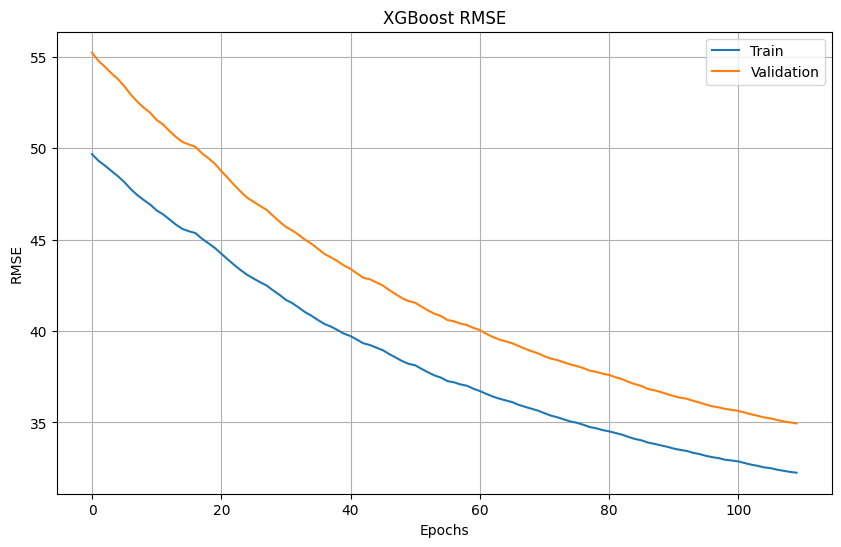

In [56]:
eval_set = [(X_train_scaled, y_train_clipped), (X_test_scaled, y_test)]
xgb.fit(X_train_scaled, y_train_clipped, eval_set=eval_set, verbose=False)
results = xgb.evals_result()

# predict and evaluate
y_hat_train = xgb.predict(X_train_scaled)
RMSE_Train, R2_Train, Score_Train = evaluate(y_train_clipped, y_hat_train, 'train')

y_hat_test = xgb.predict(X_test_scaled)
RMSE_Test, R2_Test, Score_Test = evaluate(y_test, y_hat_test)

# Make Dataframe which will contain results of all applied Model
Results=pd.concat([Results,pd.DataFrame({'Model':['XGB-clipped-150-minmaxScale'],
                                         'RMSE-Train':[RMSE_Train],
                                         'R2-Train':[R2_Train],
                                         'Score-Train':[Score_Train],
                                         'RMSE-Test':[RMSE_Test],
                                         'R2-Test':[R2_Test],
                                         'Score-Test':[Score_Test]})]
                  ,ignore_index=True)

# Plot training and validation loss
plot_training_validation_loss(results)

In [57]:
Results

,Model,RMSE-Train,R2-Train,Score-Train,RMSE-Test,R2-Test,Score-Test
0,LR,45.029737,0.576319,42990.689173,33.942725,0.601644,198.538305
1,LR-Clipped-150,27.777987,0.691029,38858.281655,31.199892,0.663423,187.043416
2,MLP-initial,63.557060,0.155951,47505.246114,54.678536,-0.033741,223.870507
3,MLP-clipped-150,52.986669,-0.124214,44264.510172,61.348164,-0.301311,230.702126
4,MLP-clipped-150-minmaxscale,29.119612,0.660463,38898.119401,32.571647,0.633176,186.783852
5,MLP-clipped-150-standardscale,28.727562,0.669544,38388.057002,31.377979,0.659570,172.022057
6,MLP-clipped-150-conditon-std,25.311602,0.743460,36312.441135,28.020404,0.728527,166.810576
7,XGB-Initial,50.093756,0.475667,45394.596051,36.236469,0.545986,215.549601
8,XGB-clipped-150,32.253956,0.583436,44137.431930,34.951580,0.577612,206.730570
9,XGB-clipped-150-minmaxScale,32.253956,0.583436,44137.431930,34.951580,0.577612,206.730570


#### XGBoost with Standarad scaler

train set RMSE: 32.25, R2: 0.58, Scoring Function: 44137.43
test set RMSE: 34.95, R2: 0.58, Scoring Function: 206.73


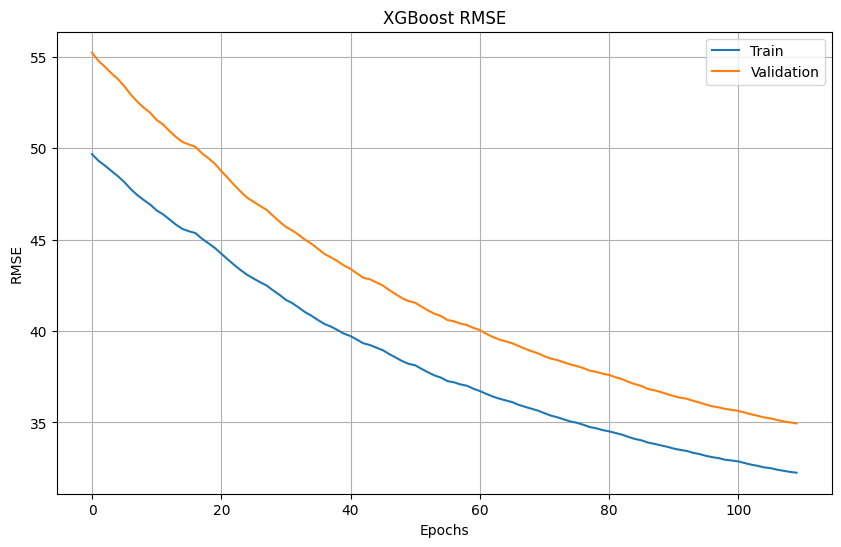

In [58]:
eval_set = [(X_train_scaled2, y_train_clipped), (X_test_scaled2, y_test)]
xgb.fit(X_train_scaled2, y_train_clipped, eval_set=eval_set, verbose=False)
results = xgb.evals_result()

# predict and evaluate
y_hat_train = xgb.predict(X_train_scaled2)
RMSE_Train, R2_Train, Score_Train = evaluate(y_train_clipped, y_hat_train, 'train')

y_hat_test = xgb.predict(X_test_scaled2)
RMSE_Test, R2_Test, Score_Test = evaluate(y_test, y_hat_test)

# Make Dataframe which will contain results of all applied Model
Results=pd.concat([Results,pd.DataFrame({'Model':['XGB-clipped-150-Standardscale'],
                                         'RMSE-Train':[RMSE_Train],
                                         'R2-Train':[R2_Train],
                                         'Score-Train':[Score_Train],
                                         'RMSE-Test':[RMSE_Test],
                                         'R2-Test':[R2_Test],
                                         'Score-Test':[Score_Test]})]
                  ,ignore_index=True)

# Plot training and validation loss
plot_training_validation_loss(results)

In [59]:
Results

,Model,RMSE-Train,R2-Train,Score-Train,RMSE-Test,R2-Test,Score-Test
0,LR,45.029737,0.576319,42990.689173,33.942725,0.601644,198.538305
1,LR-Clipped-150,27.777987,0.691029,38858.281655,31.199892,0.663423,187.043416
2,MLP-initial,63.557060,0.155951,47505.246114,54.678536,-0.033741,223.870507
3,MLP-clipped-150,52.986669,-0.124214,44264.510172,61.348164,-0.301311,230.702126
4,MLP-clipped-150-minmaxscale,29.119612,0.660463,38898.119401,32.571647,0.633176,186.783852
5,MLP-clipped-150-standardscale,28.727562,0.669544,38388.057002,31.377979,0.659570,172.022057
6,MLP-clipped-150-conditon-std,25.311602,0.743460,36312.441135,28.020404,0.728527,166.810576
7,XGB-Initial,50.093756,0.475667,45394.596051,36.236469,0.545986,215.549601
8,XGB-clipped-150,32.253956,0.583436,44137.431930,34.951580,0.577612,206.730570
9,XGB-clipped-150-minmaxScale,32.253956,0.583436,44137.431930,34.951580,0.577612,206.730570


#### XGBoost with condition based scaling

train set RMSE: 27.17, R2: 0.70, Scoring Function: 40780.02
test set RMSE: 29.35, R2: 0.70, Scoring Function: 192.11


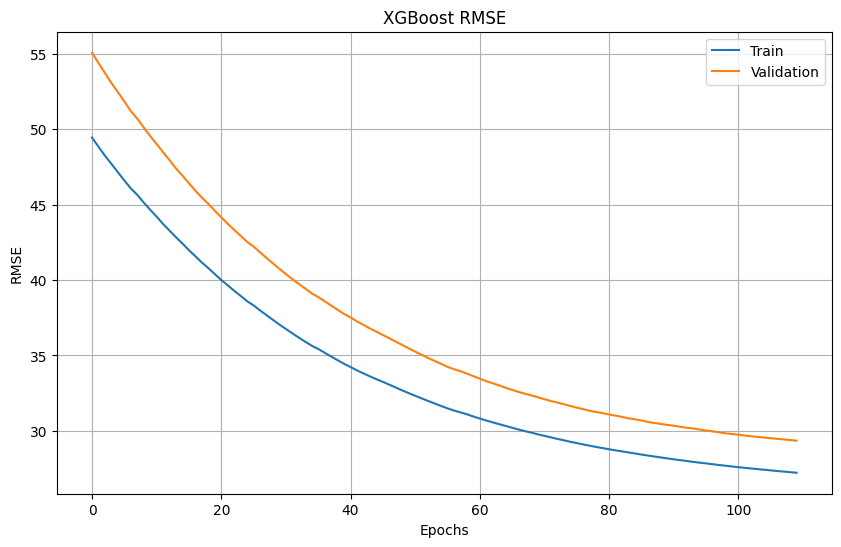

In [60]:
eval_set = [(X_train_split_condition_scaled[remaining_sensors], y_train_clipped_split_condition_scaled), (X_test_condition_scaled[remaining_sensors], y_test)]
xgb.fit(X_train_split_condition_scaled[remaining_sensors], y_train_clipped_split_condition_scaled, eval_set=eval_set, verbose=False)
results = xgb.evals_result()

# predict and evaluate
y_hat_train = xgb.predict(X_train_condition_scaled[remaining_sensors])
RMSE_Train, R2_Train, Score_Train = evaluate(y_train_clipped, y_hat_train, 'train')

y_hat_test = xgb.predict(X_test_condition_scaled[remaining_sensors])
RMSE_Test, R2_Test, Score_Test = evaluate(y_test, y_hat_test)

# Make Dataframe which will contain results of all applied Model
Results=pd.concat([Results,pd.DataFrame({'Model':['XGB-clipped-150-condition-std'],
                                         'RMSE-Train':[RMSE_Train],
                                         'R2-Train':[R2_Train],
                                         'Score-Train':[Score_Train],
                                         'RMSE-Test':[RMSE_Test],
                                         'R2-Test':[R2_Test],
                                         'Score-Test':[Score_Test]})]
                  ,ignore_index=True)

# Plot training and validation loss
plot_training_validation_loss(results)

In [61]:
Results

,Model,RMSE-Train,R2-Train,Score-Train,RMSE-Test,R2-Test,Score-Test
0,LR,45.029737,0.576319,42990.689173,33.942725,0.601644,198.538305
1,LR-Clipped-150,27.777987,0.691029,38858.281655,31.199892,0.663423,187.043416
2,MLP-initial,63.557060,0.155951,47505.246114,54.678536,-0.033741,223.870507
3,MLP-clipped-150,52.986669,-0.124214,44264.510172,61.348164,-0.301311,230.702126
4,MLP-clipped-150-minmaxscale,29.119612,0.660463,38898.119401,32.571647,0.633176,186.783852
5,MLP-clipped-150-standardscale,28.727562,0.669544,38388.057002,31.377979,0.659570,172.022057
6,MLP-clipped-150-conditon-std,25.311602,0.743460,36312.441135,28.020404,0.728527,166.810576
7,XGB-Initial,50.093756,0.475667,45394.596051,36.236469,0.545986,215.549601
8,XGB-clipped-150,32.253956,0.583436,44137.431930,34.951580,0.577612,206.730570
9,XGB-clipped-150-minmaxScale,32.253956,0.583436,44137.431930,34.951580,0.577612,206.730570


#### ANN Model

In [62]:
# Function to plot training and validation loss
def plot_training_validation_loss(history):
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

Epoch 1/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - loss: 6677.2227 - mae: 65.7315 - val_loss: 3190.5759 - val_mae: 47.5798
Epoch 2/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 5503.7119 - mae: 60.5806 - val_loss: 3959.8032 - val_mae: 53.3793
Epoch 3/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 4960.7354 - mae: 57.9174 - val_loss: 3046.4172 - val_mae: 46.6514
Epoch 4/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 4791.6377 - mae: 56.9289 - val_loss: 3157.2446 - val_mae: 47.4415
Epoch 5/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 4886.5269 - mae: 57.4984 - val_loss: 3946.1802 - val_mae: 53.2578
Epoch 6/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 4821.3403 - mae: 57.2767 - val_loss: 3903.9351 - val_mae: 53.0073
Epoch 7/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 4890.6904 - mae: 57.5062 - val_loss: 3070.2908 - val_mae: 46.7798
Epoch 8/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 4852.9780 - mae: 57.5059 - val_loss: 3494.

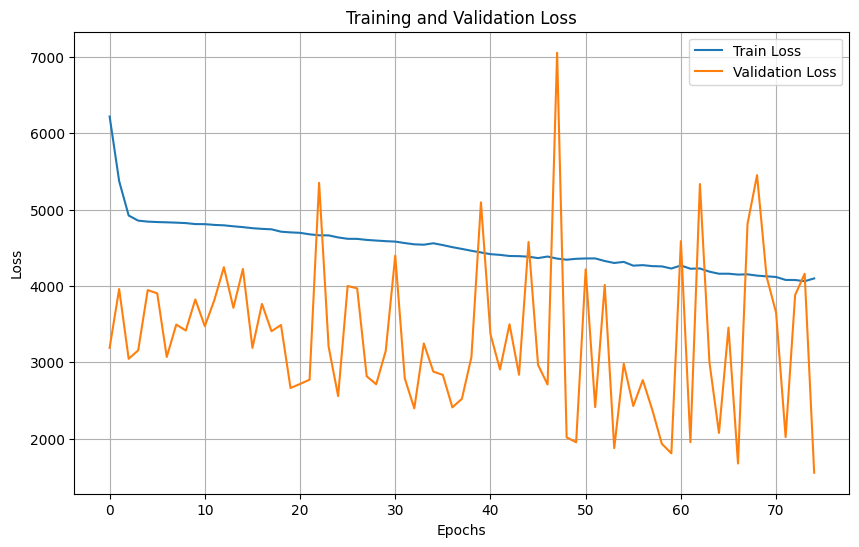

In [63]:
# Define the model
ann = tf.keras.models.Sequential()
ann.add(tf.keras.layers.Dense(units=26, activation='relu'))
ann.add(tf.keras.layers.Dense(units=10, activation='relu'))
ann.add(tf.keras.layers.Dense(units=10, activation='relu'))
ann.add(tf.keras.layers.Dense(units=1, activation='linear'))
ann.compile(optimizer='rmsprop', loss='mse', metrics=['mae'])

history = ann.fit(X_train, y_train, validation_data=(X_test, y_test), batch_size=32, epochs=75)

# Predict and evaluate
y_hat_train = ann.predict(X_train)
RMSE_Train, R2_Train, Score_Train = evaluate(y_train, y_hat_train, 'train')

y_hat_test = ann.predict(X_test)
RMSE_Test, R2_Test, Score_Test = evaluate(y_test, y_hat_test, 'test')

# Make Dataframe which will contain results of all applied Model
Results = pd.concat([Results, pd.DataFrame({'Model': ['ANN-initial'],
                                            'RMSE-Train': [RMSE_Train],
                                            'R2-Train': [R2_Train],
                                            'Score-Train': [Score_Train],
                                            'RMSE-Test': [RMSE_Test],
                                            'R2-Test': [R2_Test],
                                            'Score-Test': [Score_Test]})]
                    , ignore_index=True)

# Plot training and validation loss
plot_training_validation_loss(history)


In [64]:
Results

,Model,RMSE-Train,R2-Train,Score-Train,RMSE-Test,R2-Test,Score-Test
0,LR,45.029737,0.576319,42990.689173,33.942725,0.601644,198.538305
1,LR-Clipped-150,27.777987,0.691029,38858.281655,31.199892,0.663423,187.043416
2,MLP-initial,63.557060,0.155951,47505.246114,54.678536,-0.033741,223.870507
3,MLP-clipped-150,52.986669,-0.124214,44264.510172,61.348164,-0.301311,230.702126
4,MLP-clipped-150-minmaxscale,29.119612,0.660463,38898.119401,32.571647,0.633176,186.783852
5,MLP-clipped-150-standardscale,28.727562,0.669544,38388.057002,31.377979,0.659570,172.022057
6,MLP-clipped-150-conditon-std,25.311602,0.743460,36312.441135,28.020404,0.728527,166.810576
7,XGB-Initial,50.093756,0.475667,45394.596051,36.236469,0.545986,215.549601
8,XGB-clipped-150,32.253956,0.583436,44137.431930,34.951580,0.577612,206.730570
9,XGB-clipped-150-minmaxScale,32.253956,0.583436,44137.431930,34.951580,0.577612,206.730570


#### ANN with clipped data

Epoch 1/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2045.3910 - mae: 38.1442 - val_loss: 3272.6074 - val_mae: 49.2232
Epoch 2/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2045.4830 - mae: 38.4394 - val_loss: 2822.1738 - val_mae: 38.9090
Epoch 3/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2053.0789 - mae: 38.4062 - val_loss: 1803.5909 - val_mae: 35.4071
Epoch 4/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2047.1918 - mae: 38.6157 - val_loss: 3680.1895 - val_mae: 52.2946
Epoch 5/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2070.4014 - mae: 38.6387 - val_loss: 2421.5962 - val_mae: 41.8919
Epoch 6/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2062.4814 - mae: 38.6108 - val_loss: 4231.1465 - val_mae: 55.9805
Epoch 7/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2055.5486 - mae: 38.5097 - val_loss: 4120.2778 - val_mae: 55.2346
Epoch 8/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2044.5381 - mae: 38.5647 - val_loss: 1983.

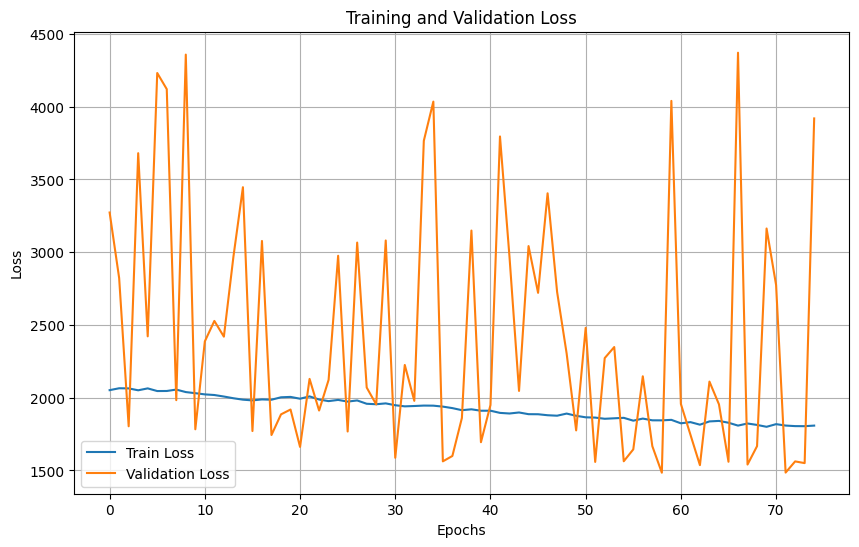

In [65]:
history = ann.fit(X_train, y_train_clipped, validation_data=(X_test, y_test), batch_size=32, epochs=75)

# Predict and evaluate
y_hat_train = ann.predict(X_train)
RMSE_Train, R2_Train, Score_Train = evaluate(y_train_clipped, y_hat_train, 'train')

y_hat_test = ann.predict(X_test)
RMSE_Test, R2_Test, Score_Test = evaluate(y_test, y_hat_test, 'test')

# Make Dataframe which will contain results of all applied Model
Results=pd.concat([Results,pd.DataFrame({'Model':['ANN-clipped-150'],
                                         'RMSE-Train':[RMSE_Train],
                                         'R2-Train':[R2_Train],
                                         'Score-Train':[Score_Train],
                                         'RMSE-Test':[RMSE_Test],
                                         'R2-Test':[R2_Test],
                                         'Score-Test':[Score_Test]})]
                  ,ignore_index=True)

# Plot training and validation loss
plot_training_validation_loss(history)


In [66]:
Results

,Model,RMSE-Train,R2-Train,Score-Train,RMSE-Test,R2-Test,Score-Test
0,LR,45.029737,0.576319,42990.689173,33.942725,0.601644,198.538305
1,LR-Clipped-150,27.777987,0.691029,38858.281655,31.199892,0.663423,187.043416
2,MLP-initial,63.557060,0.155951,47505.246114,54.678536,-0.033741,223.870507
3,MLP-clipped-150,52.986669,-0.124214,44264.510172,61.348164,-0.301311,230.702126
4,MLP-clipped-150-minmaxscale,29.119612,0.660463,38898.119401,32.571647,0.633176,186.783852
5,MLP-clipped-150-standardscale,28.727562,0.669544,38388.057002,31.377979,0.659570,172.022057
6,MLP-clipped-150-conditon-std,25.311602,0.743460,36312.441135,28.020404,0.728527,166.810576
7,XGB-Initial,50.093756,0.475667,45394.596051,36.236469,0.545986,215.549601
8,XGB-clipped-150,32.253956,0.583436,44137.431930,34.951580,0.577612,206.730570
9,XGB-clipped-150-minmaxScale,32.253956,0.583436,44137.431930,34.951580,0.577612,206.730570


#### ANN with MinMaxScaler

Epoch 1/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 3410.4558 - mae: 49.7797 - val_loss: 3003.5825 - val_mae: 46.3198
Epoch 2/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2441.0605 - mae: 43.7893 - val_loss: 2935.1348 - val_mae: 45.4574
Epoch 3/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2316.6455 - mae: 42.5210 - val_loss: 2621.2219 - val_mae: 42.7790
Epoch 4/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2271.9055 - mae: 42.0603 - val_loss: 2657.0657 - val_mae: 42.9005
Epoch 5/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2196.2817 - mae: 41.1731 - val_loss: 2536.0000 - val_mae: 41.6763
Epoch 6/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2157.7114 - mae: 40.6677 - val_loss: 2631.9902 - val_mae: 42.4102
Epoch 7/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2077.7773 - mae: 39.8092 - val_loss: 2405.6416 - val_mae: 40.5311
Epoch 8/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 2010.2222 - mae: 39.1350 - val_loss: 2282.

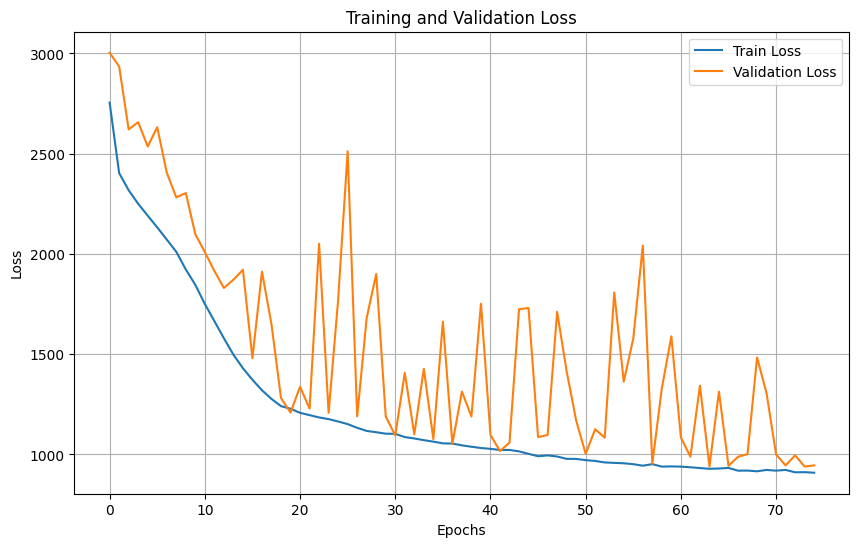

In [67]:
history = ann.fit(X_train_scaled, y_train_clipped, validation_data=(X_test_scaled, y_test), batch_size=32, epochs=75)

# Predict and evaluate
y_hat_train = ann.predict(X_train_scaled)
RMSE_Train, R2_Train, Score_Train = evaluate(y_train_clipped, y_hat_train, 'train')

y_hat_test = ann.predict(X_test_scaled)
RMSE_Test, R2_Test, Score_Test = evaluate(y_test, y_hat_test, 'test')

# Make Dataframe which will contain results of all applied Model
Results=pd.concat([Results,pd.DataFrame({'Model':['ANN-clipped-150-minmaxscale'],
                                         'RMSE-Train':[RMSE_Train],
                                         'R2-Train':[R2_Train],
                                         'Score-Train':[Score_Train],
                                         'RMSE-Test':[RMSE_Test],
                                         'R2-Test':[R2_Test],
                                         'Score-Test':[Score_Test]})]
                  ,ignore_index=True)

# Plot training and validation loss
plot_training_validation_loss(history)


In [68]:
Results

,Model,RMSE-Train,R2-Train,Score-Train,RMSE-Test,R2-Test,Score-Test
0,LR,45.029737,0.576319,42990.689173,33.942725,0.601644,198.538305
1,LR-Clipped-150,27.777987,0.691029,38858.281655,31.199892,0.663423,187.043416
2,MLP-initial,63.557060,0.155951,47505.246114,54.678536,-0.033741,223.870507
3,MLP-clipped-150,52.986669,-0.124214,44264.510172,61.348164,-0.301311,230.702126
4,MLP-clipped-150-minmaxscale,29.119612,0.660463,38898.119401,32.571647,0.633176,186.783852
5,MLP-clipped-150-standardscale,28.727562,0.669544,38388.057002,31.377979,0.659570,172.022057
6,MLP-clipped-150-conditon-std,25.311602,0.743460,36312.441135,28.020404,0.728527,166.810576
7,XGB-Initial,50.093756,0.475667,45394.596051,36.236469,0.545986,215.549601
8,XGB-clipped-150,32.253956,0.583436,44137.431930,34.951580,0.577612,206.730570
9,XGB-clipped-150-minmaxScale,32.253956,0.583436,44137.431930,34.951580,0.577612,206.730570


#### ANN with Standard Scaler

Epoch 1/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 6467.3975 - mae: 48.0115 - val_loss: 1235.1672 - val_mae: 27.8041
Epoch 2/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 928.4934 - mae: 25.2992 - val_loss: 1004.9905 - val_mae: 24.1284
Epoch 3/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 801.1404 - mae: 22.7675 - val_loss: 943.6000 - val_mae: 23.0777
Epoch 4/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 783.2784 - mae: 22.3141 - val_loss: 970.0451 - val_mae: 22.7667
Epoch 5/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 775.4360 - mae: 22.1562 - val_loss: 1048.1510 - val_mae: 25.4071
Epoch 6/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 769.9150 - mae: 22.0366 - val_loss: 907.0323 - val_mae: 22.3132
Epoch 7/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 764.2573 - mae: 21.8688 - val_loss: 930.2664 - val_mae: 22.3778
Epoch 8/75
1680/1680 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 755.7173 - mae: 21.7097 - val_loss: 1009.1011 - val_

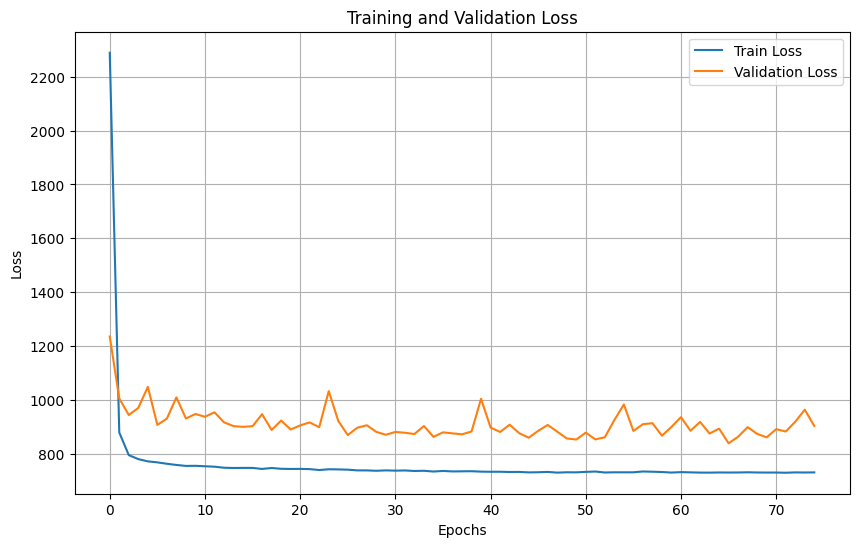

In [69]:
history = ann.fit(X_train_scaled2, y_train_clipped, validation_data=(X_test_scaled2, y_test), batch_size=32, epochs=75)

# Predict and evaluate
y_hat_train = ann.predict(X_train_scaled2)
RMSE_Train, R2_Train, Score_Train = evaluate(y_train_clipped, y_hat_train, 'train')

y_hat_test = ann.predict(X_test_scaled2)
RMSE_Test, R2_Test, Score_Test = evaluate(y_test, y_hat_test, 'test')

# Make Dataframe which will contain results of all applied Model
Results=pd.concat([Results,pd.DataFrame({'Model':['ANN-clipped-150-standardscale'],
                                         'RMSE-Train':[RMSE_Train],
                                         'R2-Train':[R2_Train],
                                         'Score-Train':[Score_Train],
                                         'RMSE-Test':[RMSE_Test],
                                         'R2-Test':[R2_Test],
                                         'Score-Test':[Score_Test]})]
                  ,ignore_index=True)

# Plot training and validation loss
plot_training_validation_loss(history)

In [70]:
# Make Dataframe which will contain results of all applied Model
Results

,Model,RMSE-Train,R2-Train,Score-Train,RMSE-Test,R2-Test,Score-Test
0,LR,45.029737,0.576319,42990.689173,33.942725,0.601644,198.538305
1,LR-Clipped-150,27.777987,0.691029,38858.281655,31.199892,0.663423,187.043416
2,MLP-initial,63.557060,0.155951,47505.246114,54.678536,-0.033741,223.870507
3,MLP-clipped-150,52.986669,-0.124214,44264.510172,61.348164,-0.301311,230.702126
4,MLP-clipped-150-minmaxscale,29.119612,0.660463,38898.119401,32.571647,0.633176,186.783852
5,MLP-clipped-150-standardscale,28.727562,0.669544,38388.057002,31.377979,0.659570,172.022057
6,MLP-clipped-150-conditon-std,25.311602,0.743460,36312.441135,28.020404,0.728527,166.810576
7,XGB-Initial,50.093756,0.475667,45394.596051,36.236469,0.545986,215.549601
8,XGB-clipped-150,32.253956,0.583436,44137.431930,34.951580,0.577612,206.730570
9,XGB-clipped-150-minmaxScale,32.253956,0.583436,44137.431930,34.951580,0.577612,206.730570


In [71]:
# Results.to_csv('model_results.csv',index=False)

**Support Vector Regression (SVR)** 

- Scaling is an important pre-processing step for SVR as it calculates the relative distances between the hyperplane and the data points. Due to the nature of our data, the large variations in values can affect the performance of SVR, where larger values can dominate smaller values. As such, scaled data is used on this model.

In [72]:
# from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR

# svr=SVR()

# # Parameter grid
# param_grid = {
#     'epsilon': [0.4, 0.3, 0.2, 0.1, 0.05],
#     'kernel': ['rbf', 'linear']
    
# }

# # Grid search with cross-validation
# grid_search = GridSearchCV(param_grid=param_grid ,cv=5,estimator=svr,n_jobs=-1,verbose=2)
# grid_search.fit(X_train_scaled, y_train)

# # Best parameters and best score
# print("Best parameters:", grid_search.best_params_)

**SVR-Initial**

In [73]:
# # Testing out the data that is not scaled
# svr = SVR(kernel = 'linear',epsilon=0.3)
# svr.fit(X_train, y_train)


# # predict and evaluate
# y_hat_train = regressor.predict(X_train)
# RMSE_Train, R2_Train, Score_Train=evaluate(y_train, y_hat_train, label='train')

# y_pred = regressor.predict(X_test)
# RMSE_Test,R2_Test, Score_Train=evaluate(y_test, y_pred)

# Results=pd.concat([Results,pd.DataFrame({'Model':['SVR-Initial'],
#                                          'RMSE-Train':[RMSE_Train],
#                                          'R2-Train':[R2_Train],
#                                          'Score-Train':[Score_Train],
#                                          'RMSE-Test':[RMSE_Test],
#                                          'R2-Test':[R2_Test],
#                                          'Score-Test':[Score_Test]})]
#                   ,ignore_index=True)

In [74]:
# Results

**SVR-clipped**

In [75]:
# svr = SVR(kernel = 'linear',epsilon=0.3)
# svr.fit(X_train, y_train_clipped)


# # predict and evaluate
# y_hat_train_clipped = svr.predict(X_train)
# RMSE_Train, R2_Train, Score_Train=evaluate(y_train_clipped, y_hat_train_clipped, 'train')

# y_pred = svr.predict(X_test)
# RMSE_Test, R2_Test, Score_Test=evaluate(y_test, y_pred)

# Results=pd.concat([Results,pd.DataFrame({'Model':['SVR-clipped'],
#                                          'RMSE-Train':[RMSE_Train],
#                                          'R2-Train':[R2_Train],
#                                          'Score-Train':[Score_Train],
#                                          'RMSE-Test':[RMSE_Test],
#                                          'R2-Test':[R2_Test],
#                                          'Score-Test':[Score_Test]})]
#                   ,ignore_index=True)

In [76]:
# Results


**SVR-clipped-150-minmaxscale**

In [77]:
svr = SVR(kernel = 'linear',epsilon=0.3)
svr.fit(X_train_scaled, y_train_clipped)


# predict and evaluate
y_hat_train_clipped = svr.predict(X_train_scaled)
RMSE_Train, R2_Train, Score_Train=evaluate(y_train_clipped, y_hat_train_clipped, 'train')

y_pred = svr.predict(X_test_scaled)
RMSE_Test, R2_Test, Score_Test=evaluate(y_test, y_pred)


# Make Dataframe which will contain results of all applied Model
Results=pd.concat([Results,pd.DataFrame({'Model':['SVR-clipped-150-minmaxscale'],
                                         'RMSE-Train':[RMSE_Train],
                                         'R2-Train':[R2_Train],
                                         'Score-Train':[Score_Train],
                                         'RMSE-Test':[RMSE_Test],
                                         'R2-Test':[R2_Test],
                                         'Score-Test':[Score_Test]})]
                  ,ignore_index=True)

train set RMSE: 34.53, R2: 0.52, Scoring Function: 43790.52
test set RMSE: 38.41, R2: 0.49, Scoring Function: 206.86


**SVR-clipped-150-standardscale**

In [78]:
svr = SVR(kernel = 'linear',epsilon=0.3)
svr.fit(X_train_scaled2, y_train_clipped)

# predict and evaluate
y_hat_train_clipped = svr.predict(X_train_scaled2)
RMSE_Train, R2_Train, Score_Train=evaluate(y_train_clipped, y_hat_train_clipped, 'train')

y_pred = svr.predict(X_test_scaled2)
RMSE_Test, R2_Test, Score_Test=evaluate(y_test, y_pred)

Results=pd.concat([Results,pd.DataFrame({'Model':['SVR-clipped-150-standardscale'],
                                         'RMSE-Train':[RMSE_Train],
                                         'R2-Train':[R2_Train],
                                         'Score-Train':[Score_Train],
                                         'RMSE-Test':[RMSE_Test],
                                         'R2-Test':[R2_Test],
                                         'Score-Test':[Score_Test]})]
                  ,ignore_index=True)

train set RMSE: 28.33, R2: 0.68, Scoring Function: 39056.57
test set RMSE: 31.16, R2: 0.66, Scoring Function: 184.82


In [79]:
Results

,Model,RMSE-Train,R2-Train,Score-Train,RMSE-Test,R2-Test,Score-Test
0,LR,45.029737,0.576319,42990.689173,33.942725,0.601644,198.538305
1,LR-Clipped-150,27.777987,0.691029,38858.281655,31.199892,0.663423,187.043416
2,MLP-initial,63.557060,0.155951,47505.246114,54.678536,-0.033741,223.870507
3,MLP-clipped-150,52.986669,-0.124214,44264.510172,61.348164,-0.301311,230.702126
4,MLP-clipped-150-minmaxscale,29.119612,0.660463,38898.119401,32.571647,0.633176,186.783852
5,MLP-clipped-150-standardscale,28.727562,0.669544,38388.057002,31.377979,0.659570,172.022057
6,MLP-clipped-150-conditon-std,25.311602,0.743460,36312.441135,28.020404,0.728527,166.810576
7,XGB-Initial,50.093756,0.475667,45394.596051,36.236469,0.545986,215.549601
8,XGB-clipped-150,32.253956,0.583436,44137.431930,34.951580,0.577612,206.730570
9,XGB-clipped-150-minmaxScale,32.253956,0.583436,44137.431930,34.951580,0.577612,206.730570


**SVR-clipped-150-conditionscale**

In [80]:
svr = SVR(kernel = 'linear',epsilon=0.3)
svr.fit(X_train_condition_scaled[remaining_sensors], y_train_clipped)

# predict and evaluate
y_hat_train = svr.predict(X_train_condition_scaled[remaining_sensors])
RMSE_Train, R2_Train, Score_Train=evaluate(y_train_clipped, y_hat_train, 'train')

y_pred = svr.predict(X_test_condition_scaled[remaining_sensors])
RMSE_Test, R2_Test, Score_Test=evaluate(y_test, y_pred)

Results=pd.concat([Results,pd.DataFrame({'Model':['SVR-clipped-150-conditionscale'],
                                         'RMSE-Train':[RMSE_Train],
                                         'R2-Train':[R2_Train],
                                         'Score-Train':[Score_Train],
                                         'RMSE-Test':[RMSE_Test],
                                         'R2-Test':[R2_Test],
                                         'Score-Test':[Score_Test]})]
                  ,ignore_index=True)

train set RMSE: 27.77, R2: 0.69, Scoring Function: 38392.61
test set RMSE: 30.95, R2: 0.67, Scoring Function: 179.26


In [81]:
Results

,Model,RMSE-Train,R2-Train,Score-Train,RMSE-Test,R2-Test,Score-Test
0,LR,45.029737,0.576319,42990.689173,33.942725,0.601644,198.538305
1,LR-Clipped-150,27.777987,0.691029,38858.281655,31.199892,0.663423,187.043416
2,MLP-initial,63.557060,0.155951,47505.246114,54.678536,-0.033741,223.870507
3,MLP-clipped-150,52.986669,-0.124214,44264.510172,61.348164,-0.301311,230.702126
4,MLP-clipped-150-minmaxscale,29.119612,0.660463,38898.119401,32.571647,0.633176,186.783852
5,MLP-clipped-150-standardscale,28.727562,0.669544,38388.057002,31.377979,0.659570,172.022057
6,MLP-clipped-150-conditon-std,25.311602,0.743460,36312.441135,28.020404,0.728527,166.810576
7,XGB-Initial,50.093756,0.475667,45394.596051,36.236469,0.545986,215.549601
8,XGB-clipped-150,32.253956,0.583436,44137.431930,34.951580,0.577612,206.730570
9,XGB-clipped-150-minmaxScale,32.253956,0.583436,44137.431930,34.951580,0.577612,206.730570


## Lagged features for MLP

In [82]:
train = add_RUL(df_train)
test = pd.read_csv(('/kaggle/input/nasa-cmaps/CMaps/test_FD002.txt'), sep='\s+', header=None, names=col_names)

def add_specific_lags(df_input, list_of_lags, columns):
    df = df_input.copy()
    for i in list_of_lags:
        lagged_columns = [col + '_lag_{}'.format(i) for col in columns]
        df[lagged_columns] = df.groupby('engine')[columns].shift(i)
    df.dropna(inplace=True)
    return df

specific_lags = [1,2,3,4,5,10,20] 

In [83]:
X_train_condition = add_operating_condition(train.drop(drop_sensors, axis=1))
X_test_condition = add_operating_condition(test.drop(drop_sensors, axis=1))

X_train_condition_scaled, X_test_condition_scaled = condition_scaler(X_train_condition, X_test_condition, remaining_sensors)

X_train_condition_scaled_lagged = add_specific_lags(X_train_condition_scaled, specific_lags, remaining_sensors)
X_test_condition_scaled_lagged = add_specific_lags(X_test_condition_scaled, specific_lags, remaining_sensors)

X_train_condition_scaled_lagged.drop(index_names+setting_names+['op_cond', 'RUL'], axis=1, inplace=True)
X_test_condition_scaled_lagged = X_test_condition_scaled_lagged.drop(['cycle', 'op_cond']+setting_names, axis=1).groupby('engine').last().copy()

idx = X_train_condition_scaled_lagged.index
y_train_clipped_lagged = y_train_clipped.iloc[idx]

split_result = train_val_group_split(
    X_train_condition_scaled_lagged, 
    y_train_clipped_lagged,
    train.iloc[idx]['engine'], 
    print_groups=False)

X_train_split_condition_scaled_lagged, y_train_clipped_split_lagged = split_result[:2]
X_val_split_condition_scaled_lagged, y_val_clipped_split_lagged = split_result[2:]


/tmp/ipykernel_18/4154894558.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[-0.1674041  -1.59188977 -0.1674041  ...  0.54483874  1.96932442
  2.68156725]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_train.loc[df_train['op_cond']==condition, sensor_names] = scaler.transform(df_train.loc[df_train['op_cond']==condition, sensor_names])
/tmp/ipykernel_18/4154894558.py:7: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[-0.87964693  1.25708158 -0.87964693 ... -0.1674041  -1.59188977
 -0.1674041 ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_test.loc[df_test['op_cond']==condition, sensor_names] = scaler.transform(df_test.loc[df_test['op_cond']==condition, sensor_names])
/tmp/ipykernel_18/899449125.py:8: PerformanceWarning: DataFram

In [84]:
input_dim = len(X_train_split_condition_scaled_lagged.columns)

model = Sequential()
model.add(Dense(16, input_dim=input_dim, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(1))

model.compile(loss='mean_squared_error', optimizer='adam')
model.save_weights('specific_lagged_weights.weights.h5')

epochs=20

history = model.fit(X_train_split_condition_scaled_lagged, y_train_clipped_split_lagged,
                    validation_data=(X_val_split_condition_scaled_lagged, y_val_clipped_split_lagged),
                    epochs=epochs)

Epoch 1/20


/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1229/1229 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 3235.8228 - val_loss: 578.6421
Epoch 2/20
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 608.8535 - val_loss: 592.2308
Epoch 3/20
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 571.3181 - val_loss: 548.6092
Epoch 4/20
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 554.5980 - val_loss: 540.3233
Epoch 5/20
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 536.4990 - val_loss: 554.4216
Epoch 6/20
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 539.5331 - val_loss: 536.6146
Epoch 7/20
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 528.0630 - val_loss: 548.5703
Epoch 8/20
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 532.3653 - val_loss: 526.1287
Epoch 9/20
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 527.3932 - val_loss: 530.8770
Epoch 10/20
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 520.4059 - val_loss: 535.4881
Epoch 11/20
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 516.3181 - val_loss: 528.0

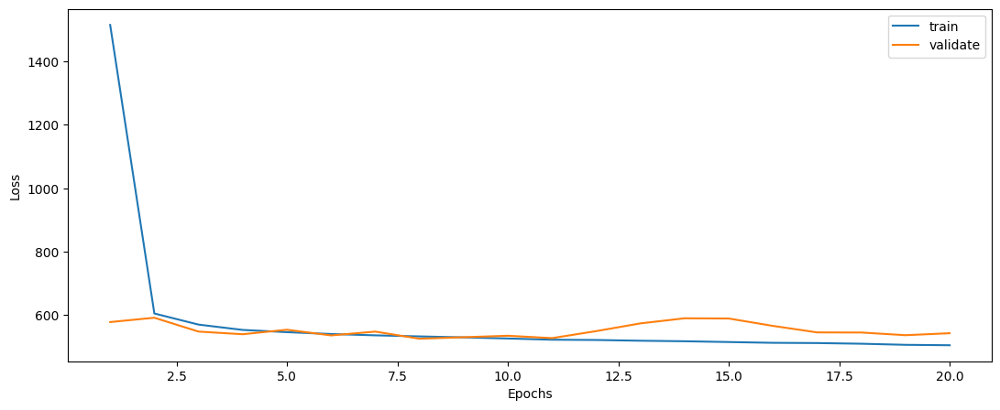

In [85]:
plot_loss(history)


In [86]:
# predict and evaluate
y_hat_train = model.predict(X_train_condition_scaled_lagged)
evaluate(y_train_clipped_lagged, y_hat_train, 'train')

y_hat_test = model.predict(X_test_condition_scaled_lagged)
evaluate(y_test, y_hat_test)


1518/1518 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
train set RMSE: 22.37, R2: 0.79, Scoring Function: 30099.06
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
test set RMSE: 27.00, R2: 0.75, Scoring Function: 157.40


(26.999622725879885, 0.7479461875940121, 157.40089841098234)

In [87]:
from statsmodels.tsa.stattools import adfuller

def find_max_diff(series):
    maxdiff = 0
    do = True
    adf, pvalue, usedlag, nobs, critical_values, icbest = adfuller(series, maxlag=1)
    if pvalue < 0.05:
        do = False
    
    while do:
        maxdiff += 1
        adf, pvalue, usedlag, nobs, critical_values, icbest = adfuller(series.diff(maxdiff).dropna(), maxlag=1)
        if pvalue < 0.05:  # if significant, stop differencing and testing for stationarity
            do = False
    return maxdiff



In [88]:
remaining_sensors

['S2(LPC outlet temperature) (◦R)',
 'S3(HPC outlet temperature) (◦R)',
 'S4(LPT outlet temperature) (◦R)',
 'S7(HPC outlet pressure) (psia)',
 'S8(Physical fan speed) (rpm)',
 'S9(Physical core speed) (rpm)',
 'S11(HPC outlet Static pressure) (psia)',
 'S12(Ratio of fuel flow to Ps30) (pps/psia)',
 'S13(Corrected fan speed) (rpm)',
 'S14(Corrected core speed) (rpm)',
 'S15(Bypass Ratio) ',
 'S17(Bleed Enthalpy)',
 'S20(High-pressure turbines Cool air flow)',
 'S21(Low-pressure turbines Cool air flow)']

Smoothed signal assumed stationary?  False


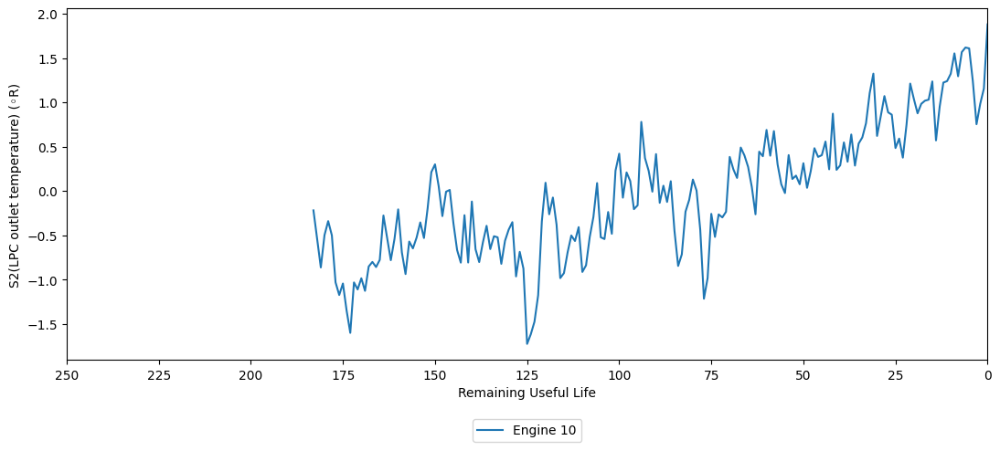

In [89]:
X_train_condition_scaled_smoothed = X_train_condition_scaled.copy()
X_train_condition_scaled_smoothed[remaining_sensors] = X_train_condition_scaled_smoothed.groupby('engine')[remaining_sensors].apply(lambda x: x.ewm(alpha=0.4).mean()).reset_index(level=0, drop=True)

s_2 = "S2(LPC outlet temperature) (◦R)"
adf, pvalue, usedlag, nobs, critical_values, icbest = adfuller(
                            X_train_condition_scaled_smoothed.loc[X_train_condition_scaled_smoothed['engine'] == 10,s_2],
                            maxlag=1)
print('Smoothed signal assumed stationary? ', pvalue < 0.05)
plot_signal(X_train_condition_scaled_smoothed, s_2, 10)

In [90]:
def exponential_smoothing(df, sensors, n_samples, alpha=0.4):
#     print("Original DataFrame:\n", df.head())
    
    df = df.copy()
    
    # First, calculate the exponential weighted mean of desired sensors
#     print("\nCalculating exponential weighted mean...")
    
    def apply_ewm(group):
        return group[sensors].ewm(alpha=alpha).mean()
    
    df[sensors] = df.groupby('engine', group_keys=False).apply(apply_ewm)
    
#     print("DataFrame after applying exponential weighted mean:\n", df.head())
    
    # Second, drop first n_samples of each unit_nr to reduce filter delay
    def create_mask(data, samples):
        result = np.ones_like(data)
        result[0:samples] = 0
        return result
    
#     print("\nCreating mask to drop first n_samples of each unit_nr...")
    mask = df.groupby('engine').cumcount().apply(lambda x: create_mask([x], samples=n_samples)[0]).astype(bool)
#     print("Mask:\n", mask.head(20))  # Print first 20 values for verification
    
#     print("\nApplying mask to DataFrame...")
    df = df[mask]
#     print("DataFrame after applying mask:\n", df.head())
    
    return df

In [91]:
# prep data
X_train_interim = add_operating_condition(train.drop(drop_sensors, axis=1))
X_test_interim = add_operating_condition(test.drop(drop_sensors, axis=1))

X_train_interim, X_test_interim = condition_scaler(X_train_interim, X_test_interim, remaining_sensors)
X_train_interim = exponential_smoothing(X_train_interim, remaining_sensors, 0, 0.4)
X_test_interim = exponential_smoothing(X_test_interim, remaining_sensors, 0, 0.4)

X_train_interim = add_specific_lags(X_train_interim, specific_lags, remaining_sensors)
X_test_interim = add_specific_lags(X_test_interim, specific_lags, remaining_sensors)

X_train_smooth_lagged = X_train_interim.drop(index_names+setting_names+['op_cond', 'RUL'], axis=1)
X_test_smooth_lagged = X_test_interim.drop(['cycle', 'op_cond']+setting_names, 
                                      axis=1).groupby('engine').last().copy()

idx = X_train_smooth_lagged.index
y_train_clipped_lagged = y_train_clipped.iloc[idx]

split_result = train_val_group_split(X_train_smooth_lagged, y_train_clipped_lagged, train.iloc[idx]['engine'], print_groups=False)
X_train_split_smooth_lagged, y_train_clipped_split_lagged = split_result[:2]
X_val_split_smooth_lagged, y_val_clipped_split_lagged = split_result[2:]


/tmp/ipykernel_18/4154894558.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[-0.1674041  -1.59188977 -0.1674041  ...  0.54483874  1.96932442
  2.68156725]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_train.loc[df_train['op_cond']==condition, sensor_names] = scaler.transform(df_train.loc[df_train['op_cond']==condition, sensor_names])
/tmp/ipykernel_18/4154894558.py:7: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[-0.87964693  1.25708158 -0.87964693 ... -0.1674041  -1.59188977
 -0.1674041 ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_test.loc[df_test['op_cond']==condition, sensor_names] = scaler.transform(df_test.loc[df_test['op_cond']==condition, sensor_names])
/tmp/ipykernel_18/3129840820.py:12: DeprecationWarning: DataFr

In [92]:
model.compile(loss='mean_squared_error', optimizer='adam')
model.load_weights('specific_lagged_weights.weights.h5')


history = model.fit(X_train_split_smooth_lagged, y_train_clipped_split_lagged,
                    validation_data=(X_val_split_smooth_lagged, y_val_clipped_split_lagged),
                    epochs=epochs)


Epoch 1/20
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 3263.9509 - val_loss: 556.8046
Epoch 2/20
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 519.8148 - val_loss: 501.2547
Epoch 3/20
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 501.0349 - val_loss: 505.2823
Epoch 4/20
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 490.9199 - val_loss: 503.0626
Epoch 5/20
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 480.4259 - val_loss: 479.2293
Epoch 6/20
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 474.4702 - val_loss: 509.5342
Epoch 7/20
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 463.6253 - val_loss: 480.6612
Epoch 8/20
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 450.4901 - val_loss: 469.3463
Epoch 9/20
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 444.1090 - val_loss: 490.5438
Epoch 10/20
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 439.3287 - val_loss: 491.9249
Epoch 11/20
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 439.4514 - val_

In [93]:
# predict and evaluate
y_hat_train = model.predict(X_train_smooth_lagged)
evaluate(y_train_clipped_lagged, y_hat_train, 'train')

y_hat_test = model.predict(X_test_smooth_lagged)
evaluate(y_test, y_hat_test)


1518/1518 ━━━━━━━━━━━━━━━━━━━━ 2s 996us/step
train set RMSE: 20.89, R2: 0.82, Scoring Function: 27839.48
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
test set RMSE: 26.15, R2: 0.76, Scoring Function: 155.04


(26.1512253634484, 0.7635376692346869, 155.03755938572658)

In [94]:
model.compile(loss='mean_squared_error', optimizer='adam')
model.load_weights('specific_lagged_weights.weights.h5')
epochs=50 



history = model.fit(X_train_split_smooth_lagged, y_train_clipped_split_lagged,
                    validation_data=(X_val_split_smooth_lagged, y_val_clipped_split_lagged),
                    epochs=epochs)


Epoch 1/50
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 3253.2515 - val_loss: 504.7329
Epoch 2/50
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 529.3394 - val_loss: 515.1060
Epoch 3/50
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 498.9816 - val_loss: 496.9667
Epoch 4/50
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 487.8135 - val_loss: 498.4475
Epoch 5/50
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 474.9338 - val_loss: 480.1677
Epoch 6/50
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 461.1505 - val_loss: 493.1606
Epoch 7/50
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 450.8148 - val_loss: 486.5784
Epoch 8/50
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 455.5444 - val_loss: 487.1872
Epoch 9/50
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 454.1221 - val_loss: 527.0541
Epoch 10/50
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 441.5121 - val_loss: 463.5831
Epoch 11/50
1229/1229 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 434.1961 - val_

In [95]:
# predict and evaluate
y_hat_train = model.predict(X_train_condition_scaled_lagged)
evaluate(y_train_clipped_lagged, y_hat_train, 'train')

y_hat_test = model.predict(X_test_condition_scaled_lagged)
evaluate(y_test, y_hat_test)


1518/1518 ━━━━━━━━━━━━━━━━━━━━ 2s 973us/step
train set RMSE: 25.54, R2: 0.73, Scoring Function: 31233.00
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
test set RMSE: 31.46, R2: 0.66, Scoring Function: 167.00


(31.457333476363214, 0.6578459445562438, 166.99654141567083)

In [96]:
def prep_data(df_train, train_label, df_test, remaining_sensors, lags, alpha, n=0):
    X_train_interim = add_operating_condition(df_train)
    X_test_interim = add_operating_condition(df_test)

    X_train_interim, X_test_interim = condition_scaler(X_train_interim, X_test_interim, remaining_sensors)

    X_train_interim = exponential_smoothing(X_train_interim, remaining_sensors, n, alpha)
    X_test_interim = exponential_smoothing(X_test_interim, remaining_sensors, n, alpha)

    X_train_interim = add_specific_lags(X_train_interim, lags, remaining_sensors)
    X_test_interim = add_specific_lags(X_test_interim, lags, remaining_sensors)

    X_train_interim.drop(index_names+setting_names+['op_cond', 'RUL'], axis=1, inplace=True)
    X_test_interim = X_test_interim.drop(
        ['cycle', 'op_cond']+setting_names, axis=1).groupby('engine').last().copy()

    idx = X_train_interim.index
    train_label = train_label.iloc[idx]
    return X_train_interim, train_label, X_test_interim, idx

def create_model(input_dim, nodes_per_layer, dropout, activation, weights_file):
    model = Sequential()
    model.add(Dense(nodes_per_layer[0], input_dim=input_dim, activation=activation))
    model.add(Dropout(dropout))
    model.add(Dense(nodes_per_layer[1], activation=activation))
    model.add(Dropout(dropout))
    model.add(Dense(nodes_per_layer[2], activation=activation))
    model.add(Dropout(dropout))
    model.add(Dense(1))
    
    model.compile(loss='mean_squared_error', optimizer='adam')
    model.save_weights(weights_file)
    return model


In [97]:
alpha = 0.05
epochs = 10 
specific_lags = [1,2,3,4,5,10,20]
nodes = [64, 128, 256]
dropout = 0.2
activation = 'tanh'
batch_size = 64

In [98]:
df_train, train_label, df_test, _ = prep_data(df_train=train.drop(drop_sensors, axis=1),
                                        train_label=y_train_clipped,
                                        df_test=test.drop(drop_sensors, axis=1), 
                                        remaining_sensors=remaining_sensors,
                                        lags=specific_lags, 
                                        alpha=alpha)

input_dim = len(df_train.columns)
weights_file = 'tuned_lagged_model_weights.weights.h5'
final_model = create_model(input_dim, 
                           nodes_per_layer=nodes, 
                           dropout=dropout, 
                           activation=activation, 
                           weights_file=weights_file)

final_model.compile(loss='mean_squared_error', optimizer='adam')
final_model.load_weights(weights_file)

final_model.fit(df_train, train_label,
               epochs=epochs,
               batch_size=batch_size)


/tmp/ipykernel_18/4154894558.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[-0.1674041  -1.59188977 -0.1674041  ...  0.54483874  1.96932442
  2.68156725]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_train.loc[df_train['op_cond']==condition, sensor_names] = scaler.transform(df_train.loc[df_train['op_cond']==condition, sensor_names])
/tmp/ipykernel_18/4154894558.py:7: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[-0.87964693  1.25708158 -0.87964693 ... -0.1674041  -1.59188977
 -0.1674041 ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_test.loc[df_test['op_cond']==condition, sensor_names] = scaler.transform(df_test.loc[df_test['op_cond']==condition, sensor_names])
/tmp/ipykernel_18/3129840820.py:12: DeprecationWarning: DataFr

Epoch 1/10
759/759 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 4195.0488
Epoch 2/10
759/759 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 415.4664
Epoch 3/10
759/759 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 384.1499
Epoch 4/10
759/759 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 368.2820
Epoch 5/10
759/759 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 362.6491
Epoch 6/10
759/759 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 359.4557
Epoch 7/10
759/759 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 357.9627
Epoch 8/10
759/759 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 357.3785
Epoch 9/10
759/759 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 354.0347
Epoch 10/10
759/759 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 348.6528


In [99]:
# predict and evaluate
y_hat_train = final_model.predict(df_train)
RMSE_Train, R2_Train, Score_Train = evaluate(train_label, y_hat_train, 'train')

y_hat_test = final_model.predict(df_test)
RMSE_Test, R2_Test, Score_Test = evaluate(y_test, y_hat_test)

# Make Dataframe which will contain results of all applied Model
Results=pd.concat([Results,pd.DataFrame({'Model':['MLP-clipped-150-conditon-std-lagged-smoothed'],
                                         'RMSE-Train':[RMSE_Train],
                                         'R2-Train':[R2_Train],
                                         'Score-Train':[Score_Train],
                                         'RMSE-Test':[RMSE_Test],
                                         'R2-Test':[R2_Test],
                                         'Score-Test':[Score_Test]})]
                  ,ignore_index=True)

1518/1518 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
train set RMSE: 17.46, R2: 0.87, Scoring Function: 26504.01
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
test set RMSE: 22.58, R2: 0.82, Scoring Function: 146.25


In [100]:
remaining_sensors

['S2(LPC outlet temperature) (◦R)',
 'S3(HPC outlet temperature) (◦R)',
 'S4(LPT outlet temperature) (◦R)',
 'S7(HPC outlet pressure) (psia)',
 'S8(Physical fan speed) (rpm)',
 'S9(Physical core speed) (rpm)',
 'S11(HPC outlet Static pressure) (psia)',
 'S12(Ratio of fuel flow to Ps30) (pps/psia)',
 'S13(Corrected fan speed) (rpm)',
 'S14(Corrected core speed) (rpm)',
 'S15(Bypass Ratio) ',
 'S17(Bleed Enthalpy)',
 'S20(High-pressure turbines Cool air flow)',
 'S21(Low-pressure turbines Cool air flow)']

In [101]:
Results

,Model,RMSE-Train,R2-Train,Score-Train,RMSE-Test,R2-Test,Score-Test
0,LR,45.029737,0.576319,42990.689173,33.942725,0.601644,198.538305
1,LR-Clipped-150,27.777987,0.691029,38858.281655,31.199892,0.663423,187.043416
2,MLP-initial,63.557060,0.155951,47505.246114,54.678536,-0.033741,223.870507
3,MLP-clipped-150,52.986669,-0.124214,44264.510172,61.348164,-0.301311,230.702126
4,MLP-clipped-150-minmaxscale,29.119612,0.660463,38898.119401,32.571647,0.633176,186.783852
5,MLP-clipped-150-standardscale,28.727562,0.669544,38388.057002,31.377979,0.659570,172.022057
6,MLP-clipped-150-conditon-std,25.311602,0.743460,36312.441135,28.020404,0.728527,166.810576
7,XGB-Initial,50.093756,0.475667,45394.596051,36.236469,0.545986,215.549601
8,XGB-clipped-150,32.253956,0.583436,44137.431930,34.951580,0.577612,206.730570
9,XGB-clipped-150-minmaxScale,32.253956,0.583436,44137.431930,34.951580,0.577612,206.730570


## Appendix
RUL Clipping https://ieeexplore.ieee.org/document/4711422